In [2]:
import matplotlib as mpl
mpl.rcParams['savefig.format'] = 'pdf'

In [3]:
import pandas as pd

base_path = "/content/drive/My Drive/TeamPrigge/lab_members/Cristian/ephys_ED/PVC_0522/spiketimes/18-18-29/"

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
# @title Load files
from scipy.io import loadmat
TTL = loadmat(base_path + 'Stim.mat')

# find last entry
last_entry = TTL ['selectedPoints'][-1]
print("The last entry in 'Stim':", last_entry)

TTL = loadmat(base_path + 'Stim.mat')

Channel32 = loadmat(base_path + 'spikeTP_times_CMR_Ch32.mat')

# find last entry
last_entry = Channel32 ['separatedMatrix'][-1]
print("The last entry in 'separatedWaveformsInChannel':", last_entry)

TTL = loadmat(base_path + 'Stim.mat')

The last entry in 'Stim': [9110339]
The last entry in 'separatedWaveformsInChannel': [     0.         325007.43333333      0.        ]


In [7]:
import numpy as np

# Assume 'TTL' and 'Channel32' are pre-loaded dictionaries containing the relevant data

# Calculate the selectedPointsInMS variable from selectedPoints and the sampling rate
sampling_rate_kHz = 30  # Sampling rate in kHz
selectedPointsInMS = TTL['selectedPoints'] / sampling_rate_kHz  # Convert to milliseconds

# Initialize a dictionary to hold the spike times for each trial
trial_spike_times = {}

# Get the number of units based on the shape of separatedMatrix
num_units = Channel32['separatedMatrix'].shape[1]

# Process each selected time point
for trial_idx, time_point in enumerate(selectedPointsInMS):
    # Define the time window for the current selected point
    window_start = time_point - 2000  # 2 seconds before the selected point
    window_end = time_point + 4000   # 4 seconds after the selected point

    # List to store spike times for each unit for the current trial
    spike_times_in_window = []

    # Extract spike times within the window for each of the units
    for unit in range(num_units):
        unit_spike_times = Channel32['separatedMatrix'][:, unit]

        # Calculate spike times relative to the current selected point
        relative_spike_times = unit_spike_times - time_point

        # Filter the spike times to only include those within the defined window
        valid_spike_times = relative_spike_times[(relative_spike_times >= -2000) & (relative_spike_times <= 4000)]
        spike_times_in_window.append(valid_spike_times)

    # Store the spike times for this trial
    trial_spike_times[trial_idx + 1] = spike_times_in_window

# Print the spike times for each unit within the window for each trial
for trial, spikes_per_unit in trial_spike_times.items():
    print(f"Trial {trial}:")
    for unit, spike_times in enumerate(spikes_per_unit, start=1):
        print(f"  Unit {unit} spike times within the window relative to selected point:")
        print(f"  {spike_times}")


Trial 1:
  Unit 1 spike times within the window relative to selected point:
  [  27.26666667   28.9         141.13333333  142.7         145.03333333
  147.4         278.16666667  279.76666667  281.66666667  284.13333333
  286.46666667  400.5         500.96666667  503.76666667  506.4
  611.93333333  614.2         615.73333333  617.36666667  733.8
  841.7         843.8         845.86666667  848.2         849.83333333
  982.63333333  984.9         987.83333333 1098.46666667 1102.46666667
 1233.9        1320.         1324.13333333 1326.7        1328.2
 1642.4        1647.13333333 1648.63333333 1650.86666667]
  Unit 2 spike times within the window relative to selected point:
  [-1899.63333333 -1848.13333333 -1845.03333333 -1749.66666667
 -1742.8        -1633.43333333 -1464.3        -1451.2
 -1407.36666667 -1376.1        -1360.6        -1265.2
 -1252.4         -671.83333333  -553.83333333  -481.53333333
  -360.73333333  -334.26666667  -292.13333333  -252.16666667
  -157.2         -129.133333

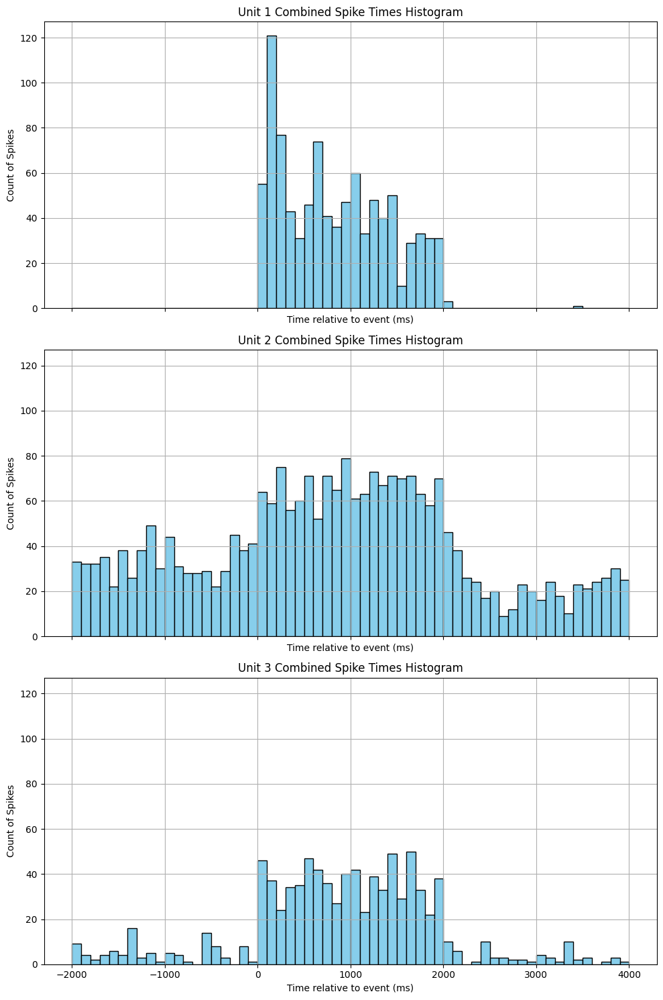

In [8]:
import matplotlib.pyplot as plt
import numpy as np

# Let's assume trial_spike_times holds all the relevant spike data as previously defined
# Initialize a list to hold all spike times for each unit
all_spikes_per_unit = [[] for _ in range(num_units)]

# Aggregate spike times for each unit across all trials
for spikes_per_unit in trial_spike_times.values():
    for unit_index, spikes in enumerate(spikes_per_unit):
        all_spikes_per_unit[unit_index].extend(spikes)

# Define the histogram bin edges
bin_edges = np.arange(-2000, 4001, 100)  # From -2000 to 4000 inclusive, with 100 ms bins

# Plot histogram for each unit
fig, axes = plt.subplots(num_units, 1, figsize=(10, num_units * 5), sharex=True, sharey=True)

if num_units == 1:
    axes = [axes]  # Ensure axes is iterable even if there's only one unit

for i, ax in enumerate(axes):
    # Convert list to numpy array for histogramming
    spike_times_array = np.array(all_spikes_per_unit[i])

    # Create histogram
    ax.hist(spike_times_array, bins=bin_edges, color='skyblue', edgecolor='black')
    ax.set_title(f'Unit {i+1} Combined Spike Times Histogram')
    ax.set_xlabel('Time relative to event (ms)')
    ax.set_ylabel('Count of Spikes')
    ax.grid(True)

plt.tight_layout()
plt.show()


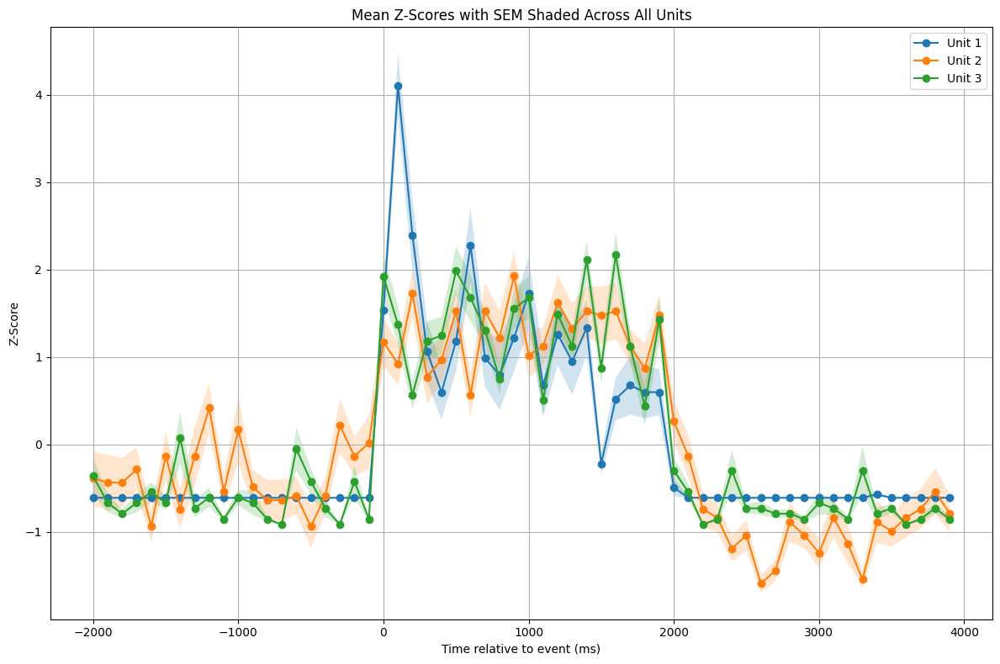

In [9]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import zscore

# Define the bin edges
bin_edges = np.arange(-2000, 4001, 100)  # From -2000 to 4000 inclusive, with 100 ms bins
num_bins = len(bin_edges) - 1

# Initialize lists to hold the mean z-scores and their SEM for each unit
mean_z_scores_per_unit = []
sem_per_unit = []

# Calculate binned spike counts for each unit and trial
all_binned_counts = [[] for _ in range(num_units)]

for spikes_per_unit in trial_spike_times.values():
    for unit_index, spikes in enumerate(spikes_per_unit):
        binned_counts, _ = np.histogram(spikes, bins=bin_edges)
        all_binned_counts[unit_index].append(binned_counts)

# Calculate mean z-scores and SEM for each unit
for unit_binned_counts in all_binned_counts:
    unit_binned_counts = np.array(unit_binned_counts)
    mean_counts = np.mean(unit_binned_counts, axis=0)
    sem_counts = np.std(unit_binned_counts, axis=0) / np.sqrt(unit_binned_counts.shape[0])
    mean_z_scores = zscore(mean_counts)  # Get the z-scores
    mean_z_scores_per_unit.append(mean_z_scores)
    sem_per_unit.append(sem_counts)

# Plot mean z-scores with SEM as shaded regions for all units
plt.figure(figsize=(12, 8))

# Plot the mean z-scores and their SEM as shaded regions for each unit
for i, (mean_z_scores, sem_counts) in enumerate(zip(mean_z_scores_per_unit, sem_per_unit)):
    plt.plot(bin_edges[:-1], mean_z_scores, label=f'Unit {i+1}', linestyle='-', marker='o')
    plt.fill_between(
        bin_edges[:-1],
        mean_z_scores - sem_counts,
        mean_z_scores + sem_counts,
        alpha=0.2  # Adjust this value to change the opacity of the shaded region
    )

plt.xlabel('Time relative to event (ms)')
plt.ylabel('Z-Score')
plt.title('Mean Z-Scores with SEM Shaded Across All Units')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


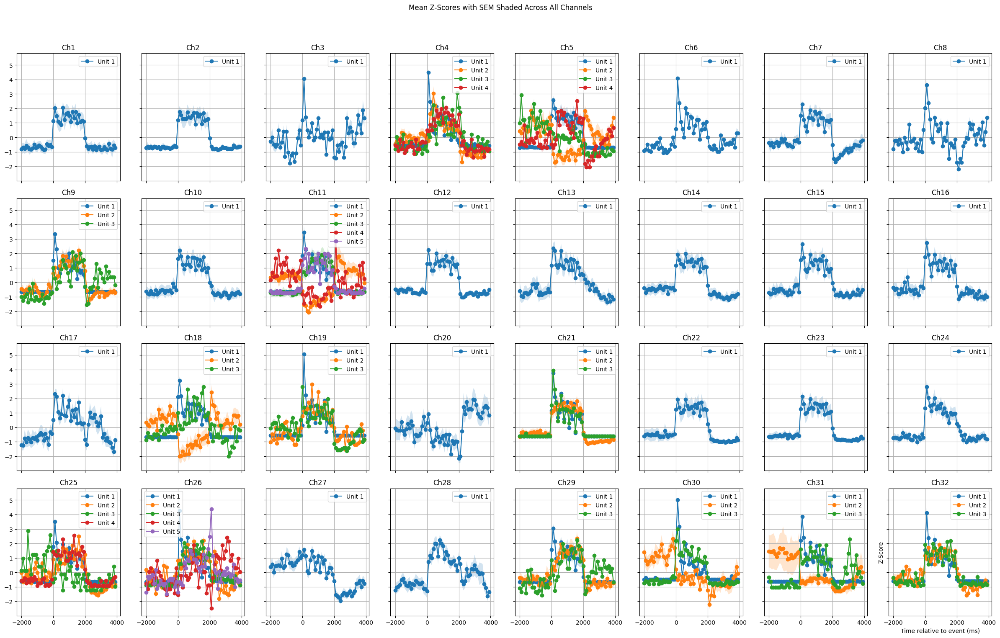

In [10]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import zscore
from scipy.io import loadmat
import os

# Define base path and parameters
base_path = "/content/drive/My Drive/TeamPrigge/lab_members/Cristian/ephys_ED/PVC_0522/spiketimes/18-18-29/"
num_channels = 32  # Total number of channels
num_rows = 4  # Rows in subplot grid
num_cols = 8  # Columns in subplot grid
bin_edges = np.arange(-2000, 4001, 100)  # Define histogram bin edges
num_bins = len(bin_edges) - 1

# Load TTL data and convert to milliseconds
TTL = loadmat(base_path + 'Stim.mat')
sampling_rate_kHz = 30  # Sampling rate in kHz
selectedPointsInMS = TTL['selectedPoints'] / sampling_rate_kHz  # Convert to milliseconds

# Initialize the trial_spike_times for all channels
all_channels_trial_spike_times = {}

# Load spike times for all channels
for channel_num in range(1, num_channels + 1):
    channel_name = f'Ch{channel_num}'
    mat_file = f'spikeTP_times_CMR_{channel_name}.mat'
    mat_data = loadmat(os.path.join(base_path, mat_file))
    separated_matrix = mat_data['separatedMatrix']
    num_units = separated_matrix.shape[1]

    # Initialize a dictionary to hold spike times per trial
    trial_spike_times = {}

    # Process each selected time point
    for trial_idx, time_point in enumerate(selectedPointsInMS):
        window_start = time_point - 2000  # 2 seconds before the point
        window_end = time_point + 4000  # 4 seconds after the point
        spike_times_in_window = []

        for unit in range(num_units):
            unit_spike_times = separated_matrix[:, unit]
            relative_spike_times = unit_spike_times - time_point
            valid_spike_times = relative_spike_times[(relative_spike_times >= -2000) & (relative_spike_times <= 4000)]
            spike_times_in_window.append(valid_spike_times)

        trial_spike_times[trial_idx + 1] = spike_times_in_window

    all_channels_trial_spike_times[channel_name] = trial_spike_times

# Create a grid for plotting
fig, axes = plt.subplots(num_rows, num_cols, figsize=(24, 16), sharex=True, sharey=True)
axes = axes.flatten()

# Loop through channels and plot Z-scores with SEM
for channel_index, (channel_name, trial_spike_times) in enumerate(all_channels_trial_spike_times.items()):
    num_units = len(next(iter(trial_spike_times.values())))
    all_binned_counts = [[] for _ in range(num_units)]

    # Aggregate the spike counts for each unit across all trials
    for spikes_per_unit in trial_spike_times.values():
        for unit_index, spikes in enumerate(spikes_per_unit):
            binned_counts, _ = np.histogram(spikes, bins=bin_edges)
            all_binned_counts[unit_index].append(binned_counts)

    # Calculate the mean Z-scores and SEM for each unit
    mean_z_scores_per_unit = []
    sem_per_unit = []
    for unit_binned_counts in all_binned_counts:
        unit_binned_counts = np.array(unit_binned_counts)
        mean_counts = np.mean(unit_binned_counts, axis=0)
        sem_counts = np.std(unit_binned_counts, axis=0) / np.sqrt(unit_binned_counts.shape[0])
        mean_z_scores = zscore(mean_counts)  # Compute the Z-scores
        mean_z_scores_per_unit.append(mean_z_scores)
        sem_per_unit.append(sem_counts)

    # Plot the data for this channel on the appropriate subplot
    ax = axes[channel_index]
    for unit_idx, (mean_z_scores, sem_counts) in enumerate(zip(mean_z_scores_per_unit, sem_per_unit)):
        ax.plot(bin_edges[:-1], mean_z_scores, label=f'Unit {unit_idx + 1}', linestyle='-', marker='o')
        ax.fill_between(
            bin_edges[:-1],
            mean_z_scores - sem_counts,
            mean_z_scores + sem_counts,
            alpha=0.2  # Adjust this to modify the opacity of the shaded area
        )
    ax.set_title(f'{channel_name}')
    ax.grid(True)
    ax.legend()

# Set the layout and titles for the overall plot
plt.xlabel('Time relative to event (ms)')
plt.ylabel('Z-Score')
plt.suptitle('Mean Z-Scores with SEM Shaded Across All Channels')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


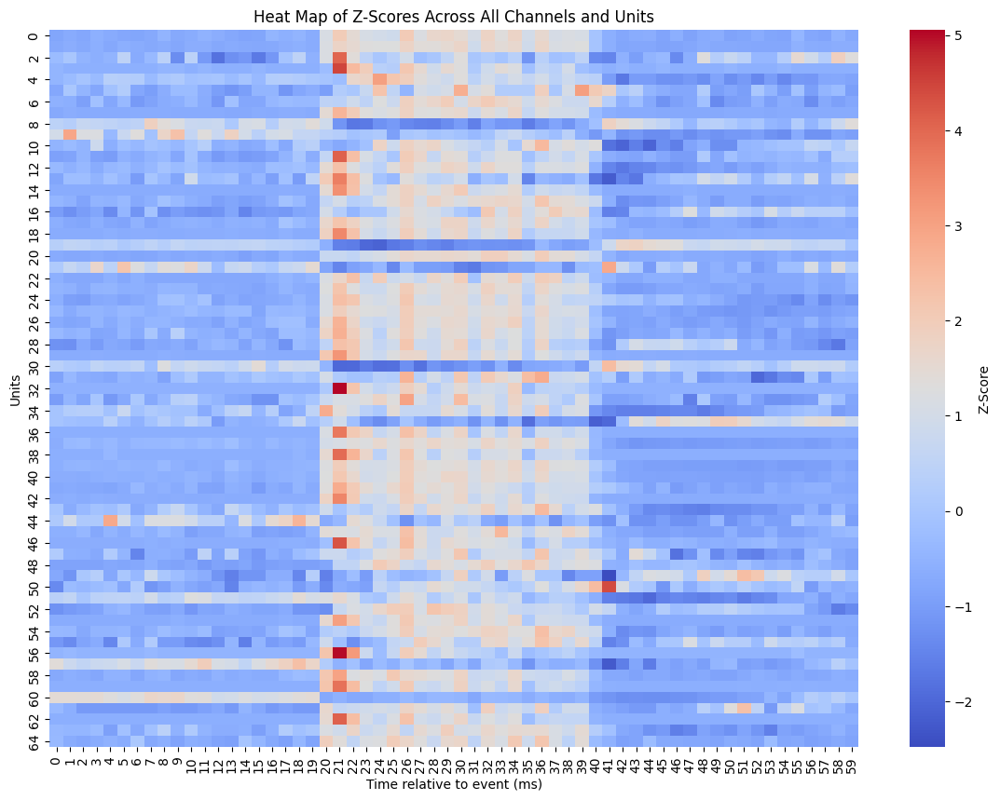

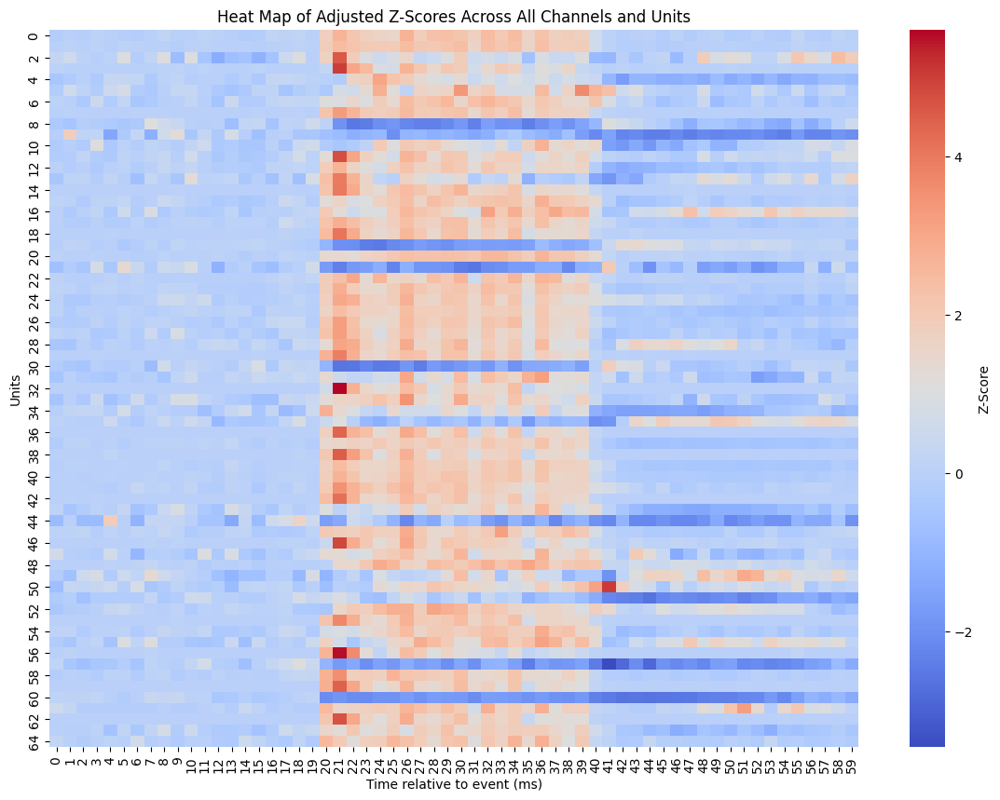

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.io import loadmat
from scipy.stats import zscore
import os

# Define base path and parameters
base_path = "/content/drive/My Drive/TeamPrigge/lab_members/Cristian/ephys_ED/PVC_0522/spiketimes/18-18-29/"
num_channels = 32  # Total number of channels
baseline_bins = 20  # First 20 bins are the baseline period
bin_edges = np.arange(-2000, 4001, 100)  # Define histogram bin edges
num_bins = len(bin_edges) - 1

# Load TTL data and convert to milliseconds
TTL = loadmat(base_path + 'Stim.mat')
sampling_rate_kHz = 30  # Sampling rate in kHz
selectedPointsInMS = TTL['selectedPoints'] / sampling_rate_kHz  # Convert to milliseconds

# Initialize a list to collect all z-scores across all channels and units
all_adjusted_z_scores = []

# Loop through each channel and collect data
for channel_num in range(1, num_channels + 1):
    channel_name = f'Ch{channel_num}'
    mat_file = f'spikeTP_times_CMR_{channel_name}.mat'
    mat_data = loadmat(os.path.join(base_path, mat_file))
    separated_matrix = mat_data['separatedMatrix']
    num_units = separated_matrix.shape[1]

    # Initialize a dictionary to hold spike times per trial
    trial_spike_times = {}

    # Process each selected time point
    for trial_idx, time_point in enumerate(selectedPointsInMS):
        window_start = time_point - 2000  # 2 seconds before the point
        window_end = time_point + 4000  # 4 seconds after the point
        spike_times_in_window = []

        for unit in range(num_units):
            unit_spike_times = separated_matrix[:, unit]
            relative_spike_times = unit_spike_times - time_point
            valid_spike_times = relative_spike_times[(relative_spike_times >= -2000) & (relative_spike_times <= 4000)]
            spike_times_in_window.append(valid_spike_times)

        trial_spike_times[trial_idx + 1] = spike_times_in_window

    # Aggregate spike counts for each unit across all trials
    all_binned_counts = [[] for _ in range(num_units)]

    for spikes_per_unit in trial_spike_times.values():
        for unit_index, spikes in enumerate(spikes_per_unit):
            binned_counts, _ = np.histogram(spikes, bins=bin_edges)
            all_binned_counts[unit_index].append(binned_counts)

    # Calculate mean z-scores and adjust using the baseline
    for unit_binned_counts in all_binned_counts:
        unit_binned_counts = np.array(unit_binned_counts)
        mean_counts = np.mean(unit_binned_counts, axis=0)
        mean_z_scores = zscore(mean_counts)

        # Calculate the baseline offset as the mean of the first 20 bins
        baseline_offset = np.mean(mean_z_scores[:baseline_bins])
        adjusted_z_scores = mean_z_scores - baseline_offset

        all_adjusted_z_scores.append(adjusted_z_scores)

# Convert the collected adjusted z-scores into a numpy array for heatmap plotting
all_adjusted_z_scores = np.array(all_adjusted_z_scores)

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(all_adjusted_z_scores, cmap='coolwarm', cbar_kws={'label': 'Z-Score'})
plt.xlabel('Time relative to event (ms)')
plt.ylabel('Units')
plt.title('Heat Map of Adjusted Z-Scores Across All Channels and Units')
plt.show()


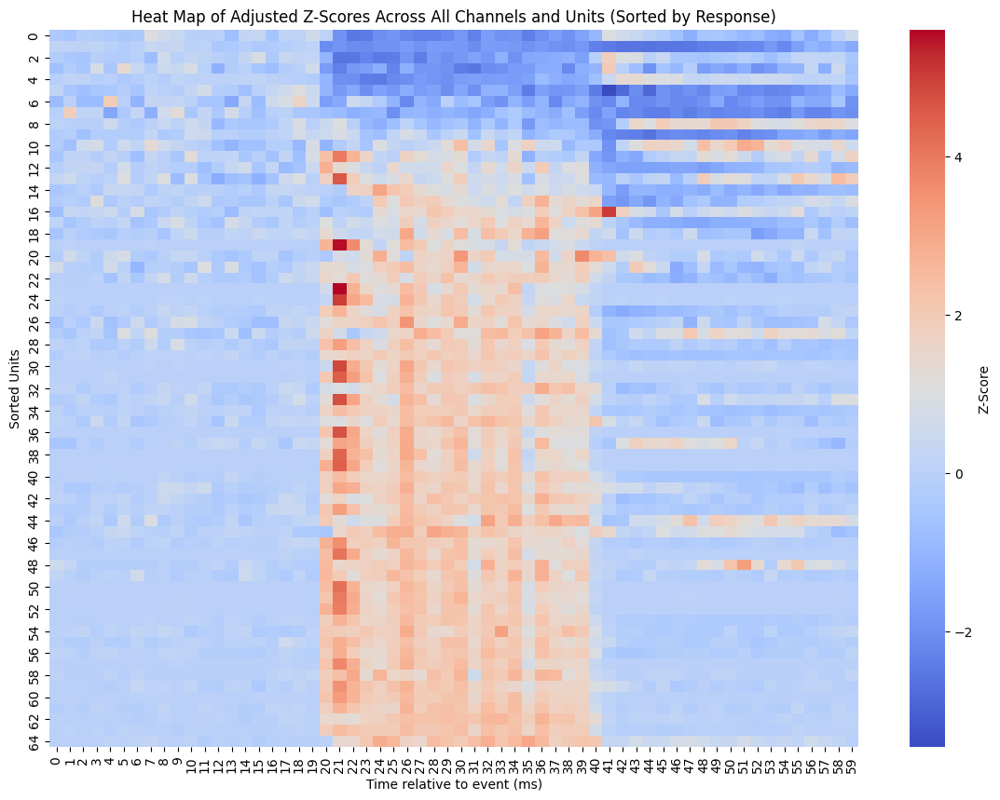

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.io import loadmat
from scipy.stats import zscore
import os

# Define base path and parameters
base_path = "/content/drive/My Drive/TeamPrigge/lab_members/Cristian/ephys_ED/PVC_0522/spiketimes/18-18-29/"

num_channels = 32  # Total number of channels
baseline_bins = 20  # First 20 bins are the baseline period
response_window = (20, 40)  # Define the response window between bins 20 and 40
bin_edges = np.arange(-2000, 4001, 100)  # Define histogram bin edges
num_bins = len(bin_edges) - 1

# Load TTL data and convert to milliseconds
TTL = loadmat(base_path + 'Stim.mat')
sampling_rate_kHz = 30  # Sampling rate in kHz
selectedPointsInMS = TTL['selectedPoints'] / sampling_rate_kHz  # Convert to milliseconds

# Initialize a list to collect all z-scores across all channels and units
all_adjusted_z_scores = []

# Initialize a list to collect the mean response difference for each unit
response_differences = []

# Loop through each channel and collect data
for channel_num in range(1, num_channels + 1):
    channel_name = f'Ch{channel_num}'
    mat_file = f'spikeTP_times_CMR_{channel_name}.mat'
    mat_data = loadmat(os.path.join(base_path, mat_file))
    separated_matrix = mat_data['separatedMatrix']
    num_units = separated_matrix.shape[1]

    # Initialize a dictionary to hold spike times per trial
    trial_spike_times = {}

    # Process each selected time point
    for trial_idx, time_point in enumerate(selectedPointsInMS):
        window_start = time_point - 2000  # 2 seconds before the point
        window_end = time_point + 4000  # 4 seconds after the point
        spike_times_in_window = []

        for unit in range(num_units):
            unit_spike_times = separated_matrix[:, unit]
            relative_spike_times = unit_spike_times - time_point
            valid_spike_times = relative_spike_times[(relative_spike_times >= -2000) & (relative_spike_times <= 4000)]
            spike_times_in_window.append(valid_spike_times)

        trial_spike_times[trial_idx + 1] = spike_times_in_window

    # Aggregate spike counts for each unit across all trials
    all_binned_counts = [[] for _ in range(num_units)]

    for spikes_per_unit in trial_spike_times.values():
        for unit_index, spikes in enumerate(spikes_per_unit):
            binned_counts, _ = np.histogram(spikes, bins=bin_edges)
            all_binned_counts[unit_index].append(binned_counts)

    # Calculate mean z-scores and adjust using the baseline
    for unit_binned_counts in all_binned_counts:
        unit_binned_counts = np.array(unit_binned_counts)
        mean_counts = np.mean(unit_binned_counts, axis=0)
        mean_z_scores = zscore(mean_counts)

        # Calculate the baseline offset as the mean of the first 20 bins
        baseline_offset = np.mean(mean_z_scores[:baseline_bins])
        adjusted_z_scores = mean_z_scores - baseline_offset

        all_adjusted_z_scores.append(adjusted_z_scores)

        # Calculate the mean response difference between the response window and baseline
        response_mean = np.mean(adjusted_z_scores[response_window[0]:response_window[1]])
        baseline_mean = np.mean(adjusted_z_scores[:baseline_bins])
        response_difference = response_mean - baseline_mean
        response_differences.append(response_difference)

# Convert the collected adjusted z-scores into a numpy array for heatmap plotting
all_adjusted_z_scores = np.array(all_adjusted_z_scores)

# Sort the units based on response differences
sorted_indices = np.argsort(response_differences)
sorted_adjusted_z_scores = all_adjusted_z_scores[sorted_indices]

# Plot the sorted heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(sorted_adjusted_z_scores, cmap='coolwarm', cbar_kws={'label': 'Z-Score'})
plt.xlabel('Time relative to event (ms)')
plt.ylabel('Sorted Units')
plt.title('Heat Map of Adjusted Z-Scores Across All Channels and Units (Sorted by Response)')
plt.show()


GTACR 1mW and 10mW

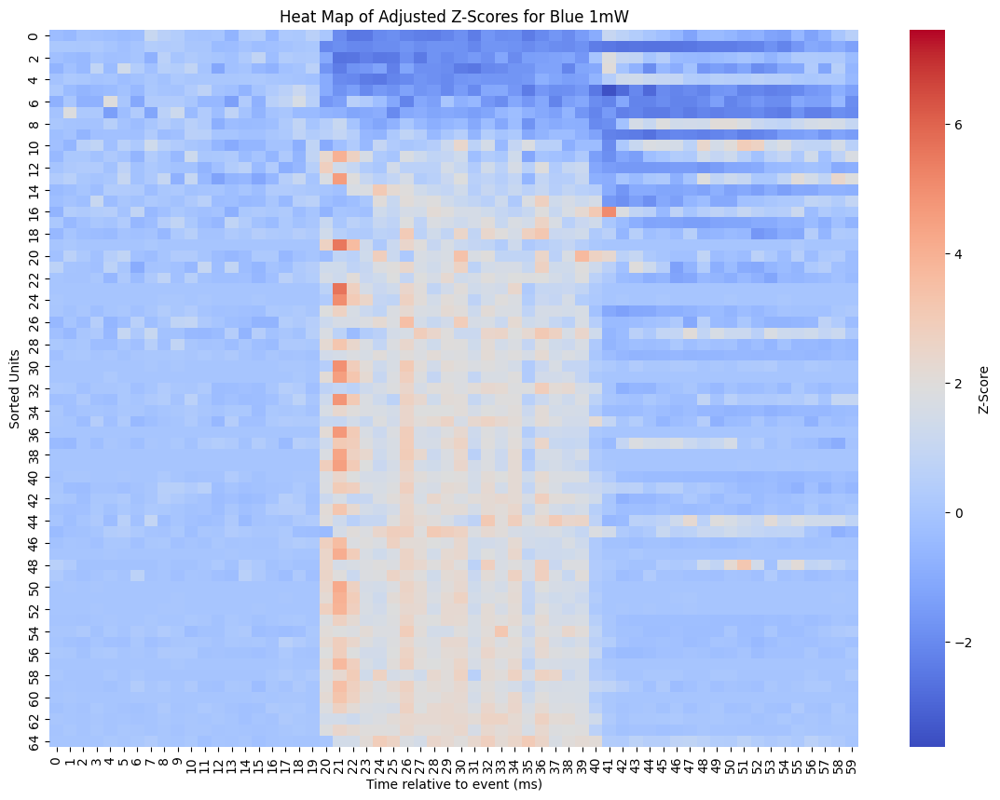

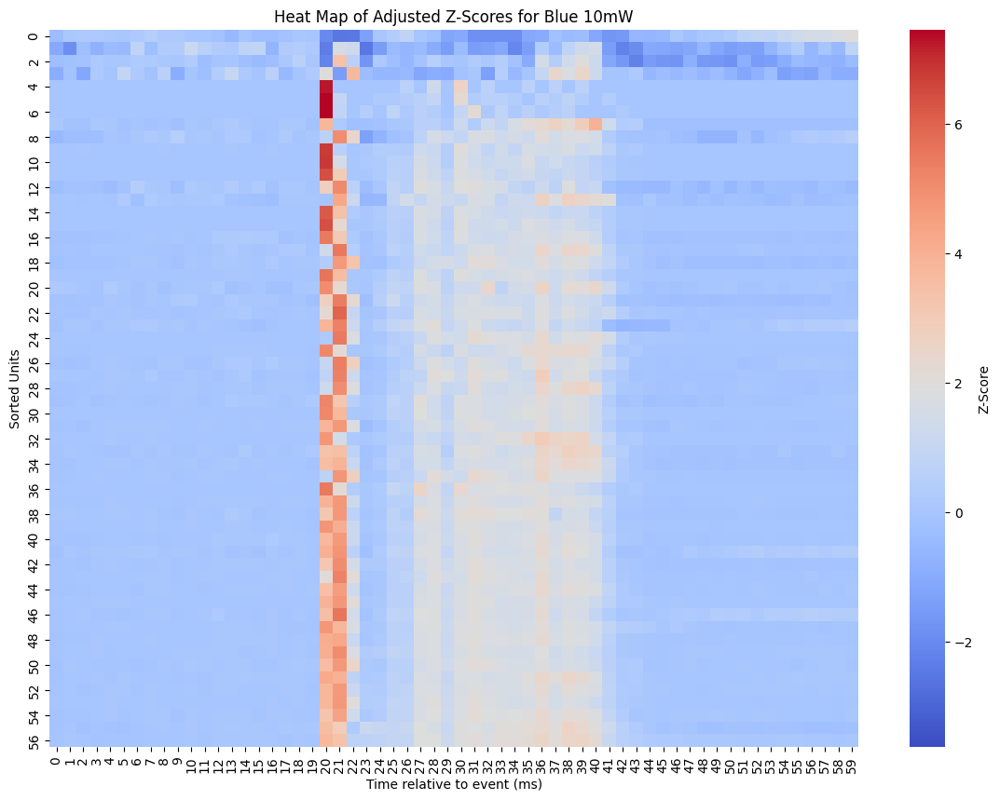

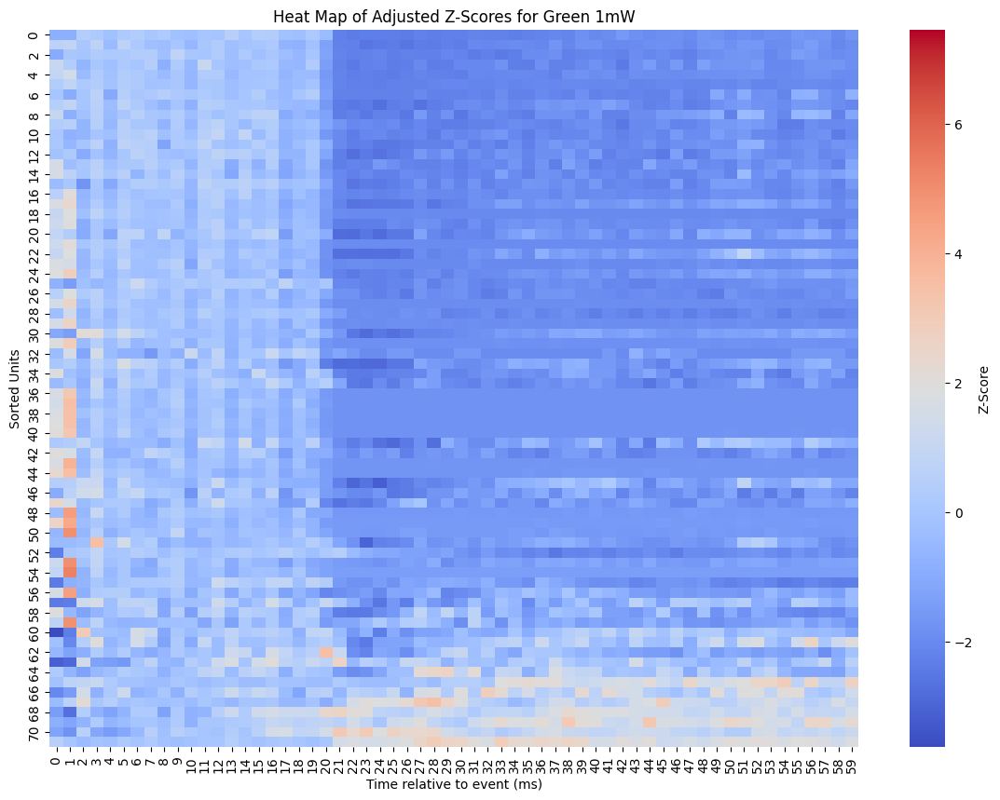

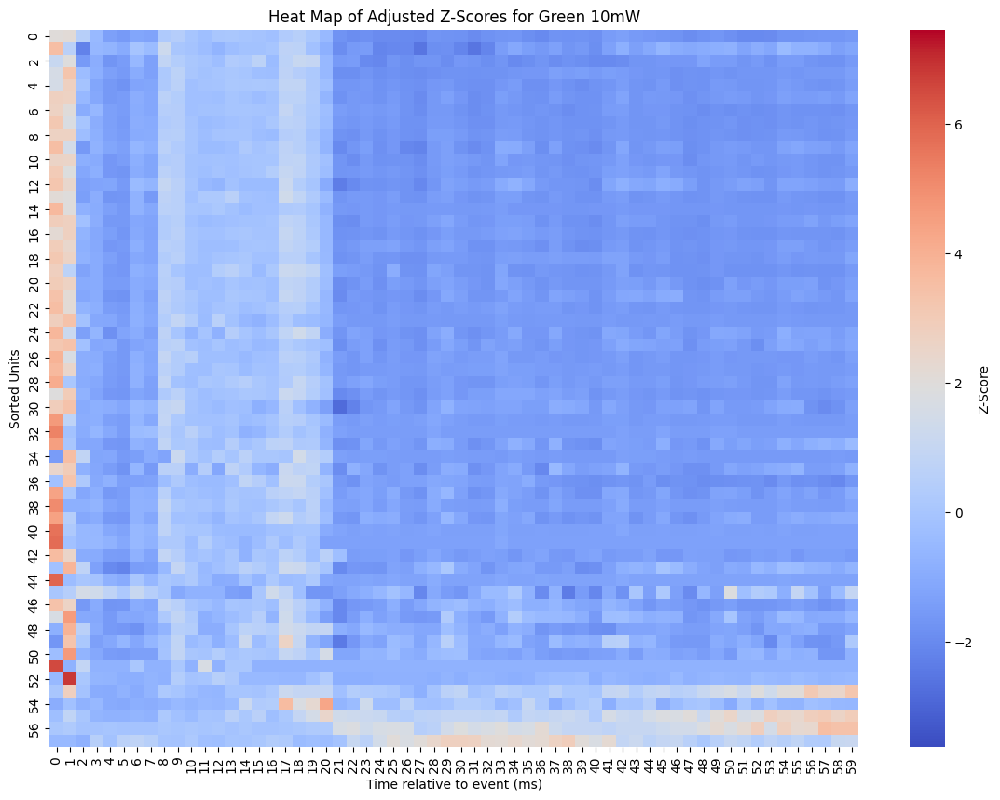

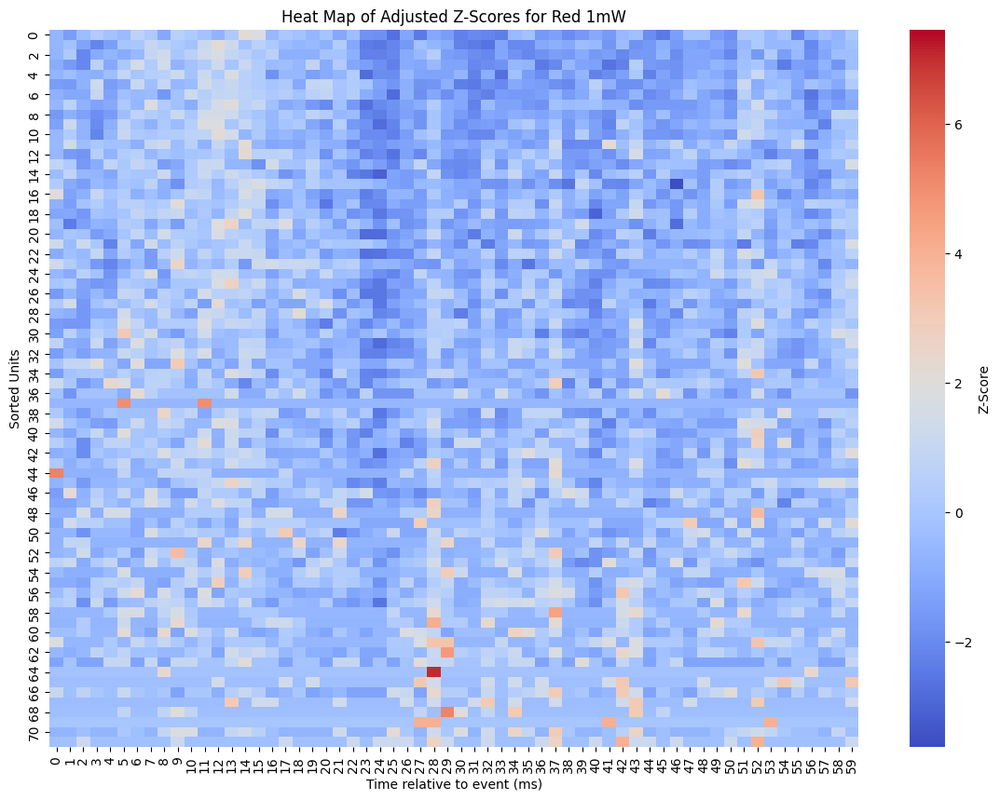

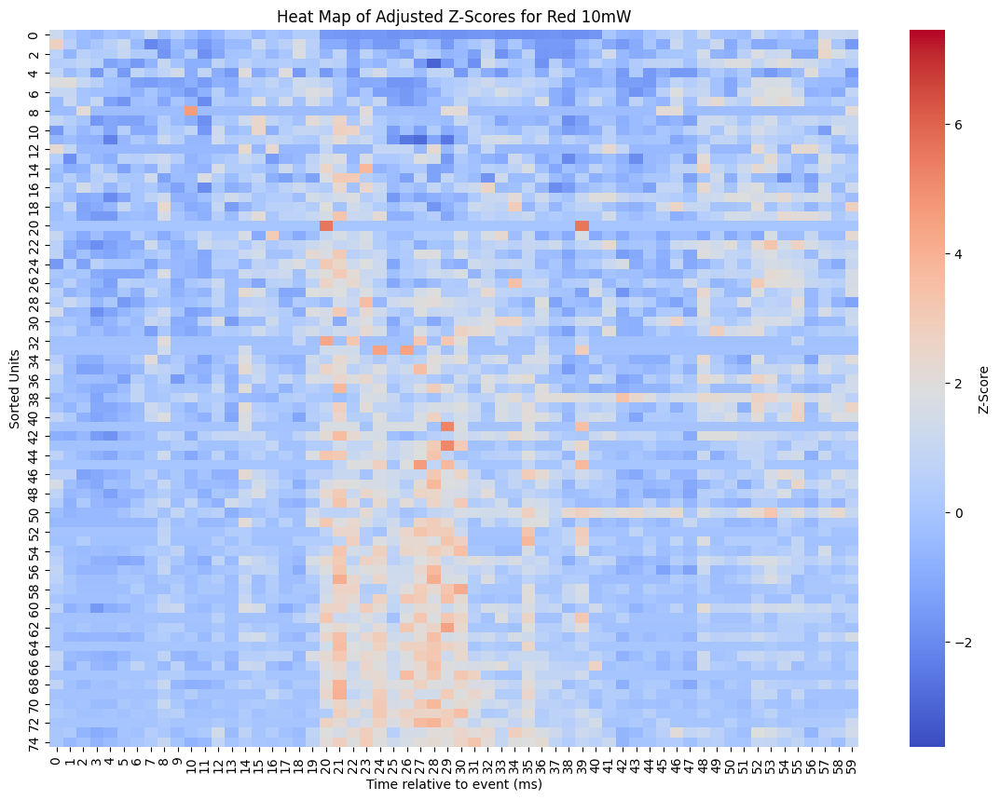

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.io import loadmat
from scipy.stats import zscore
import os

# Define base path and folders for each experiment
base_path = "/content/drive/My Drive/TeamPrigge/lab_members/Cristian/ephys_ED/PVC_0522/spiketimes/"
experiment_files = {
    'Blue 1mW': '18-18-29',
    'Blue 10mW': '18-34-11',
    'Green 1mW': '19-14-51',
    'Green 10mW': '19-30-15',
    'Red 1mW': '18-43-01',
    'Red 10mW': '18-58-28'
}
num_channels = 32  # Total number of channels per experiment
baseline_bins = 20  # First 20 bins are the baseline period
response_window = (20, 40)  # Define the response window between bins 20 and 40
bin_edges = np.arange(-2000, 4001, 100)  # Define histogram bin edges
num_bins = len(bin_edges) - 1

# Initialize a dictionary to hold all heatmaps for normalization
all_z_scores_data = {}

# Loop through each experiment folder
for condition, folder in experiment_files.items():
    # Load TTL data for the current folder
    ttl_file_path = os.path.join(base_path, folder, 'Stim.mat')
    TTL = loadmat(ttl_file_path)
    sampling_rate_kHz = 30  # Sampling rate in kHz
    selectedPointsInMS = TTL['selectedPoints'] / sampling_rate_kHz  # Convert to milliseconds

    # Initialize a list to collect all z-scores across all channels and units for this condition
    all_adjusted_z_scores = []

    # Initialize a list to collect the mean response difference for each unit
    response_differences = []

    # Loop through each channel in this experiment
    for channel_num in range(1, num_channels + 1):
        channel_name = f'Ch{channel_num}'
        mat_file = f'spikeTP_times_CMR_{channel_name}.mat'
        mat_data = loadmat(os.path.join(base_path, folder, mat_file))
        separated_matrix = mat_data['separatedMatrix']
        num_units = separated_matrix.shape[1]

        # Initialize a dictionary to hold spike times per trial
        trial_spike_times = {}

        # Process each selected time point
        for trial_idx, time_point in enumerate(selectedPointsInMS):
            window_start = time_point - 2000  # 2 seconds before the point
            window_end = time_point + 4000  # 4 seconds after the point
            spike_times_in_window = []

            for unit in range(num_units):
                unit_spike_times = separated_matrix[:, unit]
                relative_spike_times = unit_spike_times - time_point
                valid_spike_times = relative_spike_times[(relative_spike_times >= -2000) & (relative_spike_times <= 4000)]
                spike_times_in_window.append(valid_spike_times)

            trial_spike_times[trial_idx + 1] = spike_times_in_window

        # Aggregate spike counts for each unit across all trials
        all_binned_counts = [[] for _ in range(num_units)]

        for spikes_per_unit in trial_spike_times.values():
            for unit_index, spikes in enumerate(spikes_per_unit):
                binned_counts, _ = np.histogram(spikes, bins=bin_edges)
                all_binned_counts[unit_index].append(binned_counts)

        # Calculate mean z-scores and adjust using the baseline
        for unit_binned_counts in all_binned_counts:
            unit_binned_counts = np.array(unit_binned_counts)
            mean_counts = np.mean(unit_binned_counts, axis=0)
            mean_z_scores = zscore(mean_counts)

            # Calculate the baseline offset as the mean of the first 20 bins
            baseline_offset = np.mean(mean_z_scores[:baseline_bins])
            adjusted_z_scores = mean_z_scores - baseline_offset

            all_adjusted_z_scores.append(adjusted_z_scores)

            # Calculate the mean response difference between the response window and baseline
            response_mean = np.mean(adjusted_z_scores[response_window[0]:response_window[1]])
            baseline_mean = np.mean(adjusted_z_scores[:baseline_bins])
            response_difference = response_mean - baseline_mean
            response_differences.append(response_difference)

    # Sort the units based on response differences
    sorted_indices = np.argsort(response_differences)
    sorted_adjusted_z_scores = np.array(all_adjusted_z_scores)[sorted_indices]

    # Store sorted data in the dictionary for consistent color scaling
    all_z_scores_data[condition] = sorted_adjusted_z_scores

# Get the global min and max values for a consistent color scale across all conditions
global_min = min(np.min(scores) for scores in all_z_scores_data.values())
global_max = max(np.max(scores) for scores in all_z_scores_data.values())


# Define the base directory path
base_dir = '/content/drive/My Drive/TeamPrigge/lab_members/Cristian/ephys_ED/PVC_0522/'

# Loop through your data and generate heatmaps
for condition, sorted_adjusted_z_scores in all_z_scores_data.items():
    plt.figure(figsize=(14, 10))
    sns.heatmap(sorted_adjusted_z_scores, cmap='coolwarm', vmin=global_min, vmax=global_max, cbar_kws={'label': 'Z-Score'})
    plt.xlabel('Time relative to event (ms)')
    plt.ylabel('Sorted Units')
    plt.title(f'Heat Map of Adjusted Z-Scores for {condition}')

    # Generate the full file path using the sanitized condition name
    output_path = os.path.join(base_path,'0522_GtACR' f'{condition}')

    # Ensure the directory exists
    os.makedirs(base_dir, exist_ok=True)

    # Save the plot before calling plt.show()
    plt.savefig(output_path)
    plt.show()



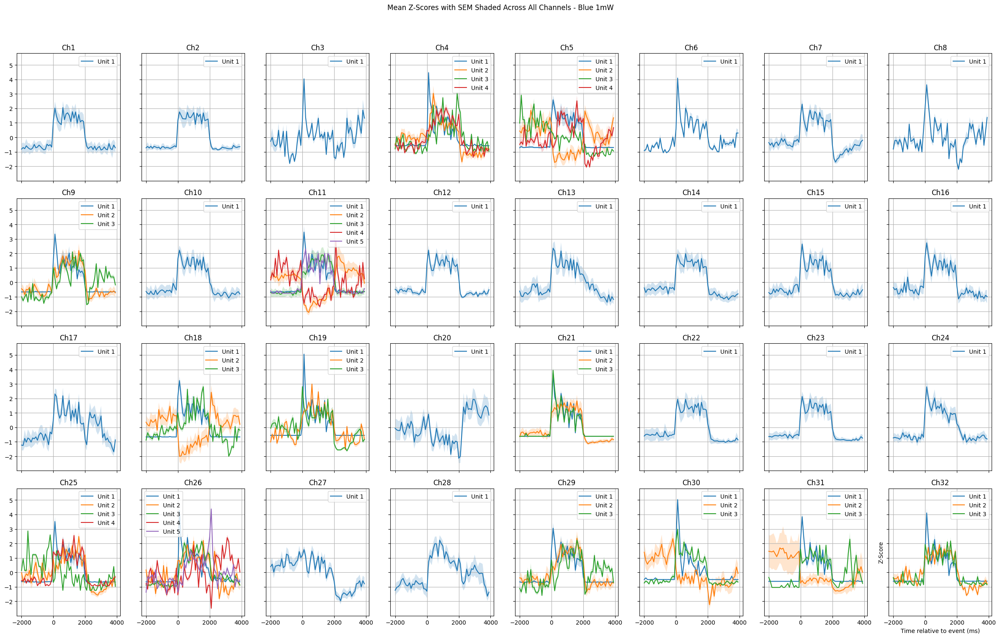

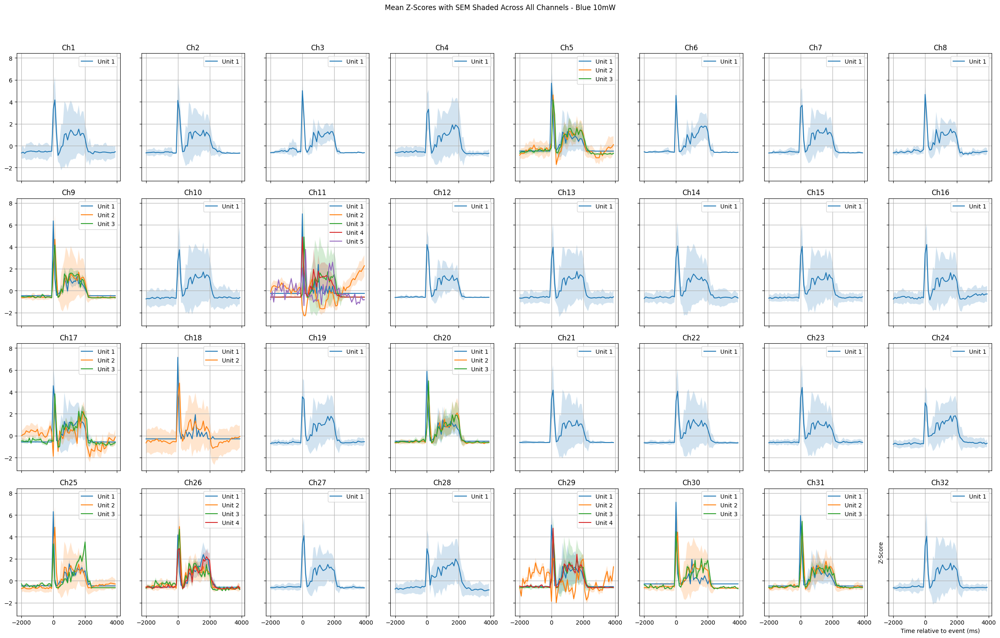

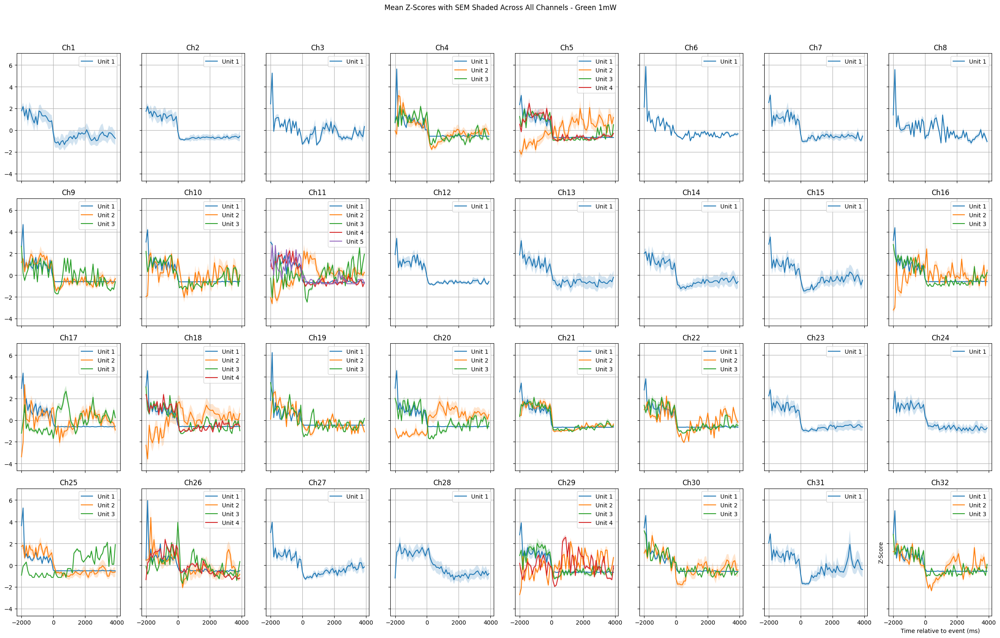

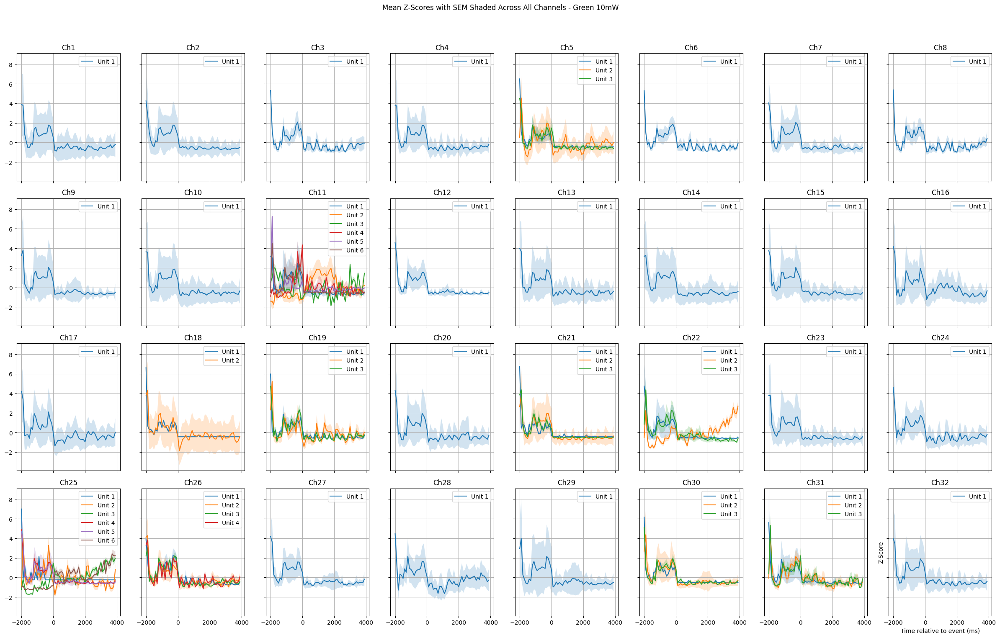

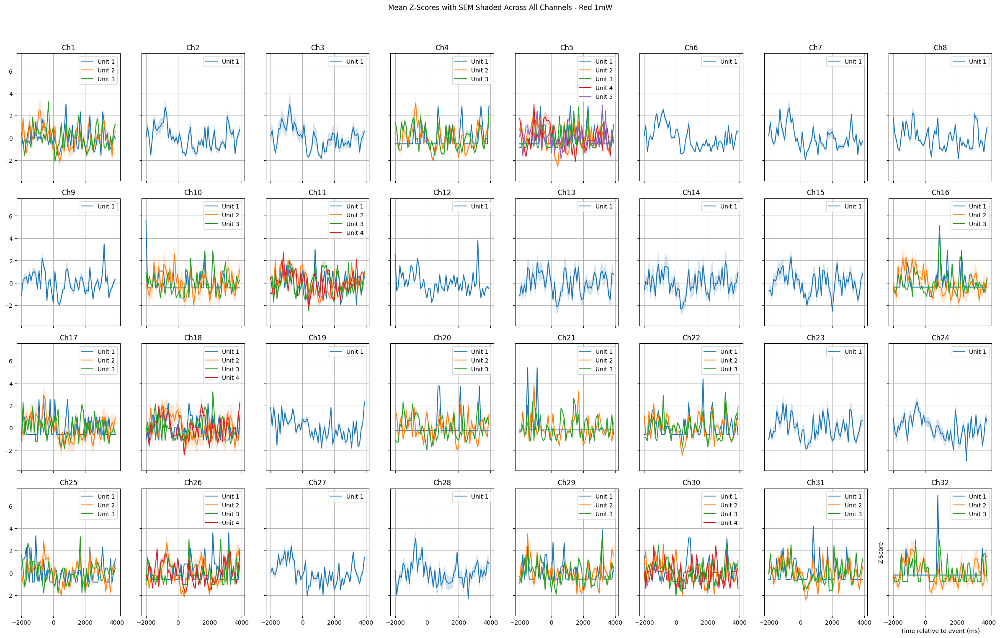

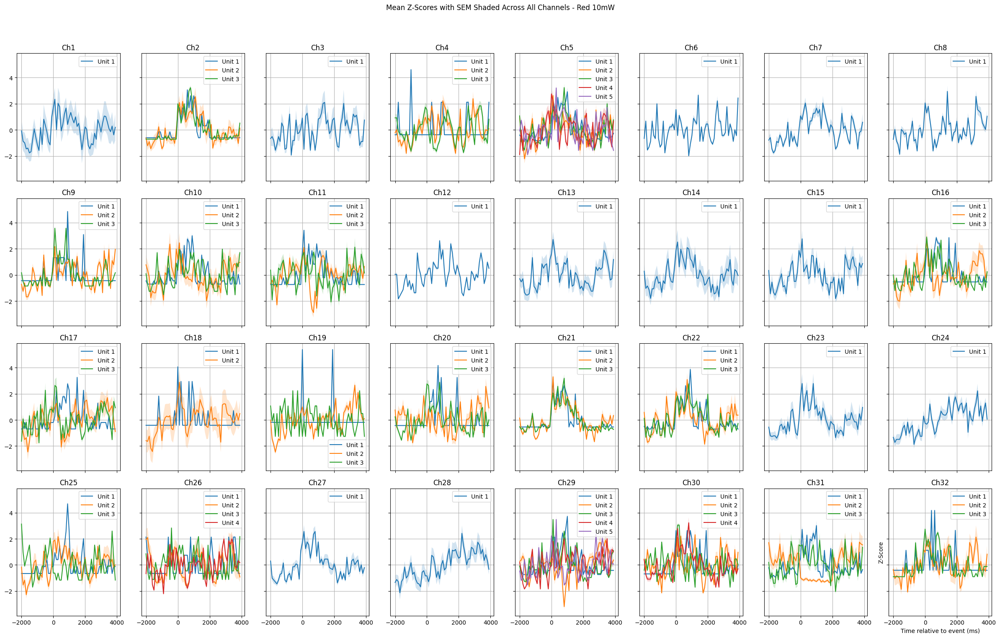

In [14]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import zscore
from scipy.io import loadmat
import os

# Define base path and folders for each experiment
base_path = "/content/drive/My Drive/TeamPrigge/lab_members/Cristian/ephys_ED/PVC_0522/spiketimes/"
experiment_files = {
    'Blue 1mW': '18-18-29',
    'Blue 10mW': '18-34-11',
    'Green 1mW': '19-14-51',
    'Green 10mW': '19-30-15',
    'Red 1mW': '18-43-01',
    'Red 10mW': '18-58-28'
}
num_channels = 32  # Total number of channels
num_rows = 4  # Rows in subplot grid
num_cols = 8  # Columns in subplot grid
bin_edges = np.arange(-2000, 4001, 100)  # Define histogram bin edges

# Loop through each experiment folder and generate plots
for condition, folder in experiment_files.items():
    # Load TTL data for the current folder
    ttl_file_path = os.path.join(base_path, folder, 'Stim.mat')
    TTL = loadmat(ttl_file_path)
    sampling_rate_kHz = 30  # Sampling rate in kHz
    selected_points_in_ms = TTL['selectedPoints'] / sampling_rate_kHz  # Convert to milliseconds

    # Initialize the trial_spike_times for all channels
    all_channels_trial_spike_times = {}

    # Load spike times for all channels
    for channel_num in range(1, num_channels + 1):
        channel_name = f'Ch{channel_num}'
        mat_file = f'spikeTP_times_CMR_{channel_name}.mat'
        mat_data = loadmat(os.path.join(base_path, folder, mat_file))
        separated_matrix = mat_data['separatedMatrix']
        num_units = separated_matrix.shape[1]

        # Initialize a dictionary to hold spike times per trial
        trial_spike_times = {}

        # Process each selected time point
        for trial_idx, time_point in enumerate(selected_points_in_ms):
            window_start = time_point - 2000  # 2 seconds before the point
            window_end = time_point + 4000  # 4 seconds after the point
            spike_times_in_window = []

            for unit in range(num_units):
                unit_spike_times = separated_matrix[:, unit]
                relative_spike_times = unit_spike_times - time_point
                valid_spike_times = relative_spike_times[(relative_spike_times >= -2000) & (relative_spike_times <= 4000)]
                spike_times_in_window.append(valid_spike_times)

            trial_spike_times[trial_idx + 1] = spike_times_in_window

        all_channels_trial_spike_times[channel_name] = trial_spike_times

    # Create a grid for plotting
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(24, 16), sharex=True, sharey=True)
    axes = axes.flatten()

    # Loop through channels and plot Z-scores with SEM
    for channel_index, (channel_name, trial_spike_times) in enumerate(all_channels_trial_spike_times.items()):
        num_units = len(next(iter(trial_spike_times.values())))
        all_binned_counts = [[] for _ in range(num_units)]

        # Aggregate the spike counts for each unit across all trials
        for spikes_per_unit in trial_spike_times.values():
            for unit_index, spikes in enumerate(spikes_per_unit):
                binned_counts, _ = np.histogram(spikes, bins=bin_edges)
                all_binned_counts[unit_index].append(binned_counts)

        # Calculate the mean Z-scores and SEM for each unit
        mean_z_scores_per_unit = []
        sem_per_unit = []
        for unit_binned_counts in all_binned_counts:
            unit_binned_counts = np.array(unit_binned_counts)
            mean_counts = np.mean(unit_binned_counts, axis=0)
            sem_counts = np.std(unit_binned_counts, axis=0) / np.sqrt(unit_binned_counts.shape[0])
            mean_z_scores = zscore(mean_counts)  # Compute the Z-scores
            mean_z_scores_per_unit.append(mean_z_scores)
            sem_per_unit.append(sem_counts)

        # Plot the data for this channel on the appropriate subplot
        ax = axes[channel_index]
        for unit_idx, (mean_z_scores, sem_counts) in enumerate(zip(mean_z_scores_per_unit, sem_per_unit)):
            ax.plot(bin_edges[:-1], mean_z_scores, label=f'Unit {unit_idx + 1}', linestyle='-')
            ax.fill_between(
                bin_edges[:-1],
                mean_z_scores - sem_counts,
                mean_z_scores + sem_counts,
                alpha=0.2  # Adjust this to modify the opacity of the shaded area
            )
        ax.set_title(f'{channel_name}')
        ax.grid(True)
        ax.legend()

    # Set the layout and titles for the overall plot
    plt.xlabel('Time relative to event (ms)')
    plt.ylabel('Z-Score')
    plt.suptitle(f'Mean Z-Scores with SEM Shaded Across All Channels - {condition}')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Save the plot for each condition
    output_path = os.path.join(base_path, f'{condition}_ZScores_All_Channels.pdf')
    plt.savefig(output_path)

    plt.show()


PVC-Mutante (RaACR)

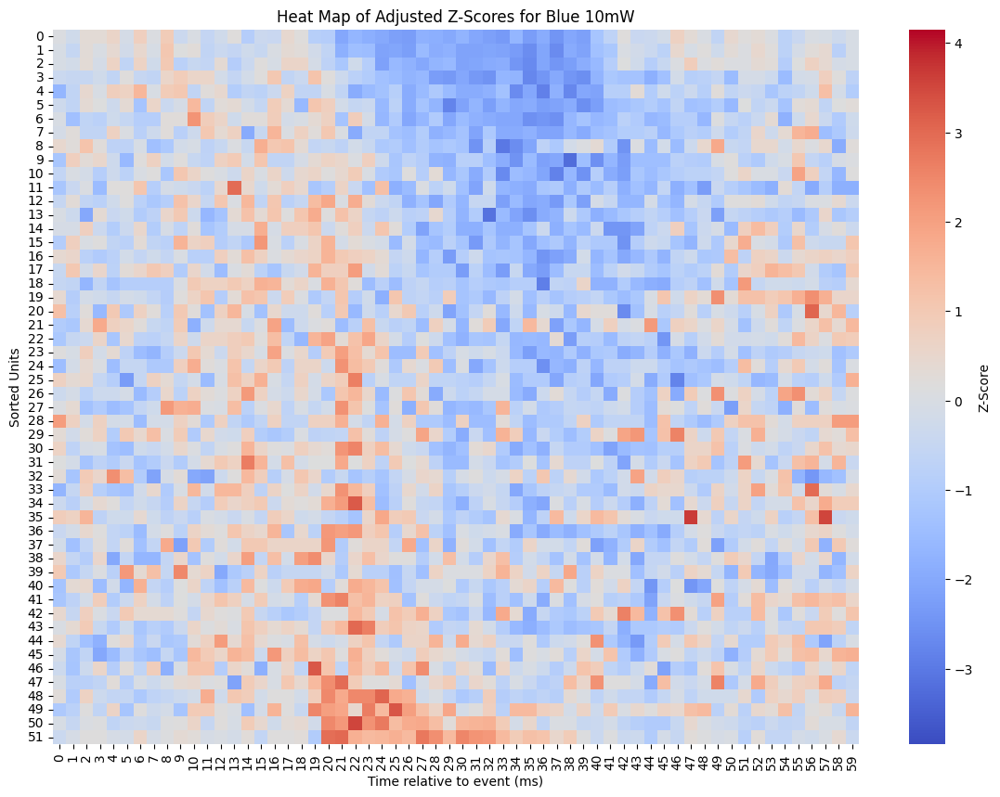

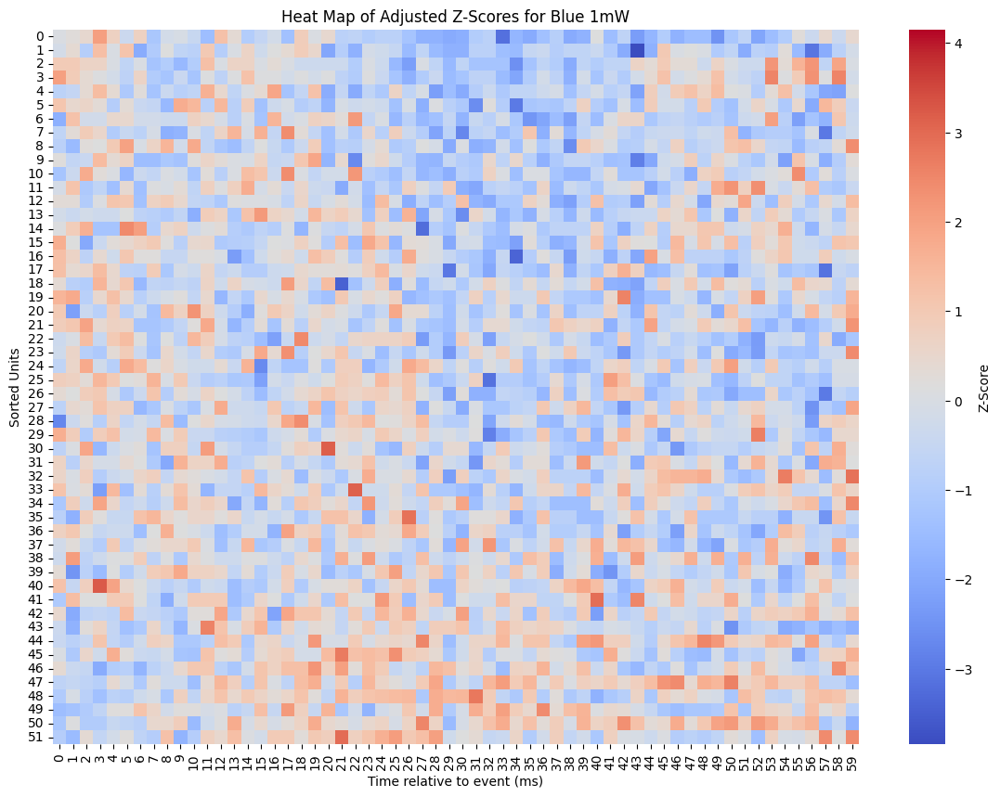

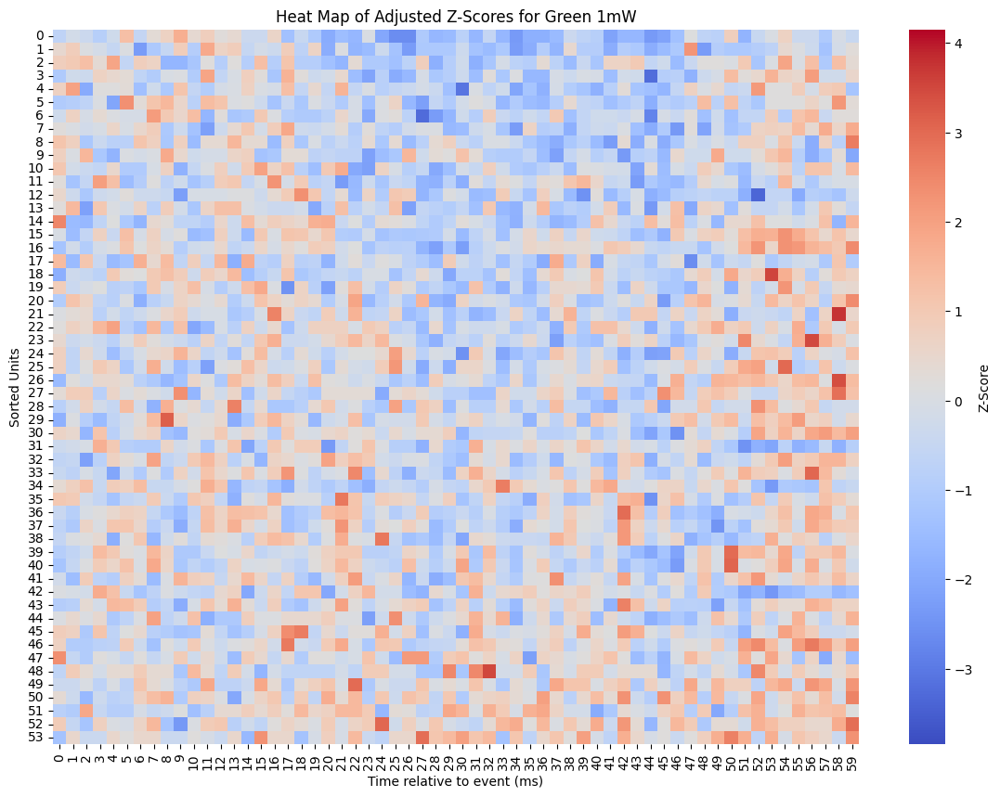

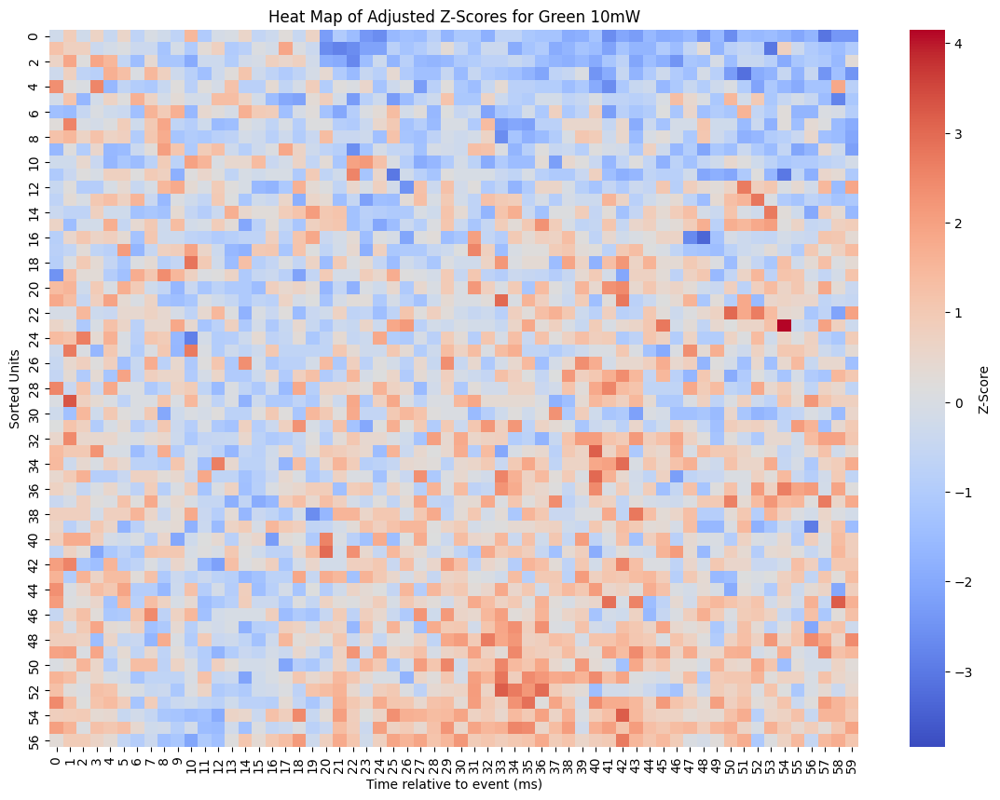

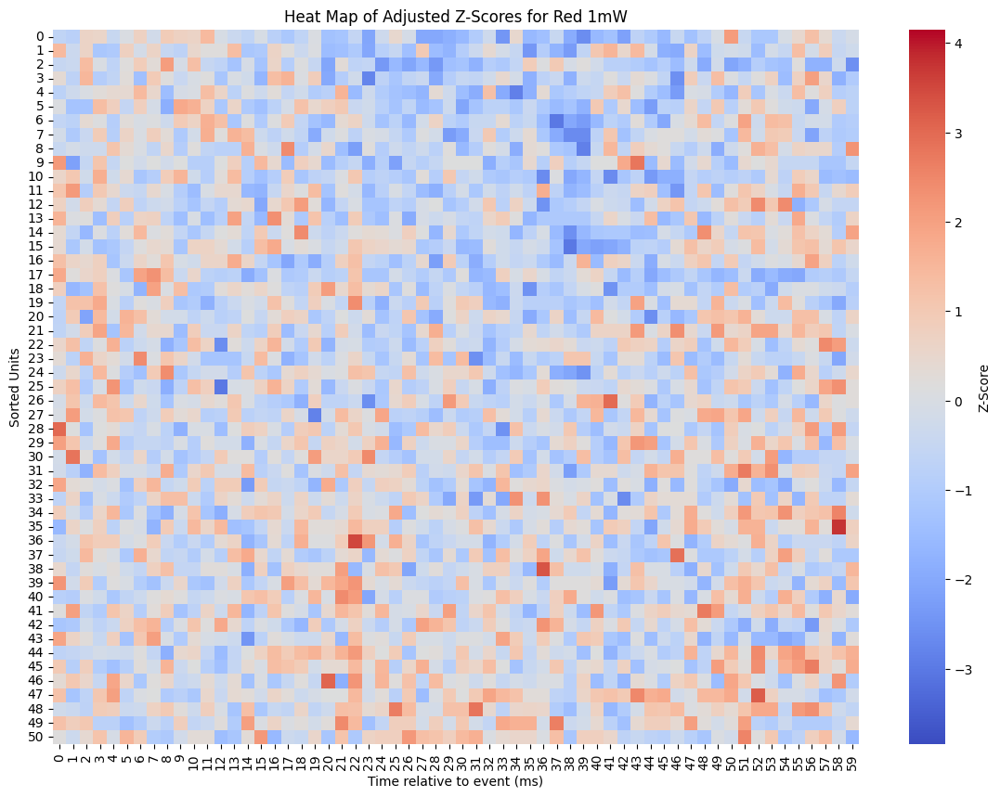

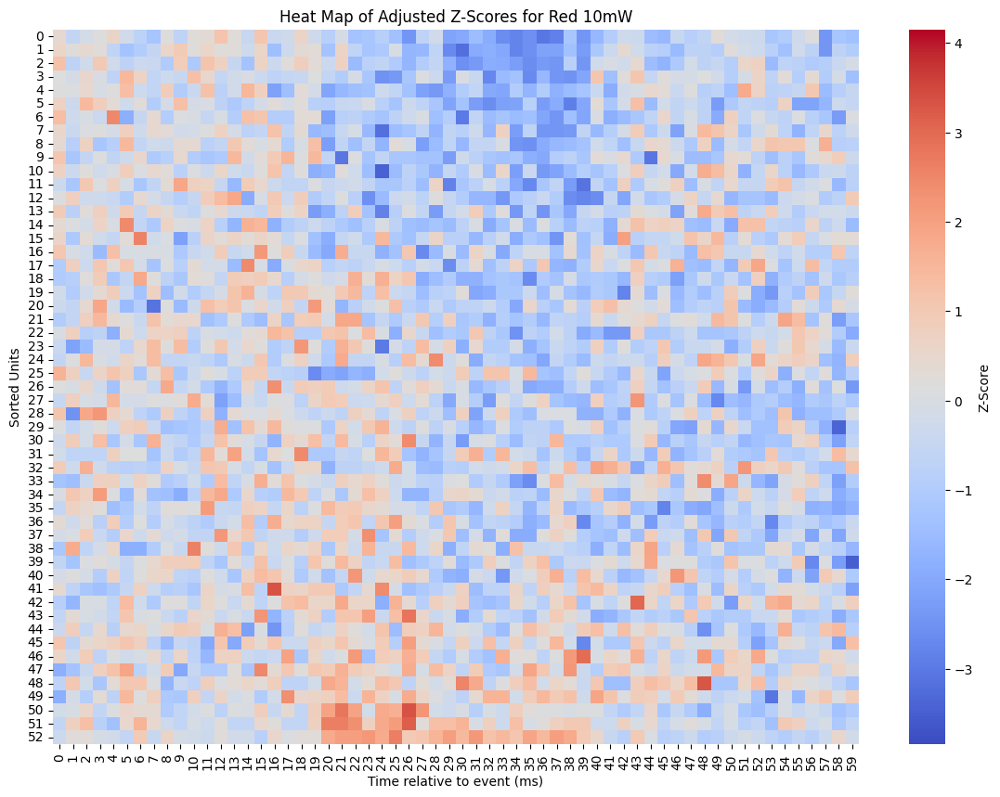

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.io import loadmat
from scipy.stats import zscore
import os

# Define base path and folders for each experiment
base_path = "/content/drive/My Drive/TeamPrigge/lab_members/Cristian/ephys_ED/PVC_0521/spiketimes/"
experiment_files = {
    'Blue 10mW': '16-30-14',
    'Blue 1mW': '16-15-21',
    'Green 1mW': '17-09-29',
    'Green 10mW': '17-26-26',
    'Red 1mW': '16-38-34',
    'Red 10mW': '16-53-13'
}
num_channels = 32  # Total number of channels per experiment
baseline_bins = 20  # First 20 bins are the baseline period
response_window = (20, 40)  # Define the response window between bins 20 and 40
bin_edges = np.arange(-2000, 4001, 100)  # Define histogram bin edges
num_bins = len(bin_edges) - 1

# Initialize a dictionary to hold all heatmaps for normalization
all_z_scores_data = {}

# Loop through each experiment folder
for condition, folder in experiment_files.items():
    # Load TTL data for the current folder
    ttl_file_path = os.path.join(base_path, folder, 'Stim.mat')
    TTL = loadmat(ttl_file_path)
    sampling_rate_kHz = 30  # Sampling rate in kHz
    selectedPointsInMS = TTL['selectedPoints'] / sampling_rate_kHz  # Convert to milliseconds

    # Initialize a list to collect all z-scores across all channels and units for this condition
    all_adjusted_z_scores = []

    # Initialize a list to collect the mean response difference for each unit
    response_differences = []

    # Loop through each channel in this experiment
    for channel_num in range(1, num_channels + 1):
        channel_name = f'Ch{channel_num}'
        mat_file = f'spikeTP_times_CMR_{channel_name}.mat'
        mat_data = loadmat(os.path.join(base_path, folder, mat_file))
        separated_matrix = mat_data['separatedMatrix']
        num_units = separated_matrix.shape[1]

        # Initialize a dictionary to hold spike times per trial
        trial_spike_times = {}

        # Process each selected time point
        for trial_idx, time_point in enumerate(selectedPointsInMS):
            window_start = time_point - 2000  # 2 seconds before the point
            window_end = time_point + 4000  # 4 seconds after the point
            spike_times_in_window = []

            for unit in range(num_units):
                unit_spike_times = separated_matrix[:, unit]
                relative_spike_times = unit_spike_times - time_point
                valid_spike_times = relative_spike_times[(relative_spike_times >= -2000) & (relative_spike_times <= 4000)]
                spike_times_in_window.append(valid_spike_times)

            trial_spike_times[trial_idx + 1] = spike_times_in_window

        # Aggregate spike counts for each unit across all trials
        all_binned_counts = [[] for _ in range(num_units)]

        for spikes_per_unit in trial_spike_times.values():
            for unit_index, spikes in enumerate(spikes_per_unit):
                binned_counts, _ = np.histogram(spikes, bins=bin_edges)
                all_binned_counts[unit_index].append(binned_counts)

        # Calculate mean z-scores and adjust using the baseline, excluding units with any zero bin counts
        for unit_binned_counts in all_binned_counts:
            unit_binned_counts = np.array(unit_binned_counts)
            # Check if any bin has a zero count across all trials
            if np.any(np.sum(unit_binned_counts, axis=0) == 0):
                continue  # Skip this unit

            mean_counts = np.mean(unit_binned_counts, axis=0)
            mean_z_scores = zscore(mean_counts)

            # Calculate the baseline offset as the mean of the first 20 bins
            baseline_offset = np.mean(mean_z_scores[:baseline_bins])
            adjusted_z_scores = mean_z_scores - baseline_offset

            all_adjusted_z_scores.append(adjusted_z_scores)

            # Calculate the mean response difference between the response window and baseline
            response_mean = np.mean(adjusted_z_scores[response_window[0]:response_window[1]])
            baseline_mean = np.mean(adjusted_z_scores[:baseline_bins])
            response_difference = response_mean - baseline_mean
            response_differences.append(response_difference)

    # Sort the units based on response differences
    sorted_indices = np.argsort(response_differences)
    sorted_adjusted_z_scores = np.array(all_adjusted_z_scores)[sorted_indices]

    # Store sorted data in the dictionary for consistent color scaling
    all_z_scores_data[condition] = sorted_adjusted_z_scores

# Get the global min and max values for a consistent color scale across all conditions
global_min = min(np.min(scores) for scores in all_z_scores_data.values())
global_max = max(np.max(scores) for scores in all_z_scores_data.values())

# Plot all heatmaps with consistent color scaling
for condition, sorted_adjusted_z_scores in all_z_scores_data.items():
    plt.figure(figsize=(14, 10))
    sns.heatmap(sorted_adjusted_z_scores, cmap='coolwarm', vmin=global_min, vmax=global_max, cbar_kws={'label': 'Z-Score'})
    plt.xlabel('Time relative to event (ms)')
    plt.ylabel('Sorted Units')
    plt.title(f'Heat Map of Adjusted Z-Scores for {condition}')

    # Generate the full file path using the sanitized condition name
    output_path = os.path.join(base_path,'0521RaACR' f'{condition}')

    # Ensure the directory exists
    os.makedirs(base_dir, exist_ok=True)

    # Save the plot before calling plt.show()
    plt.savefig(output_path)
    plt.show()


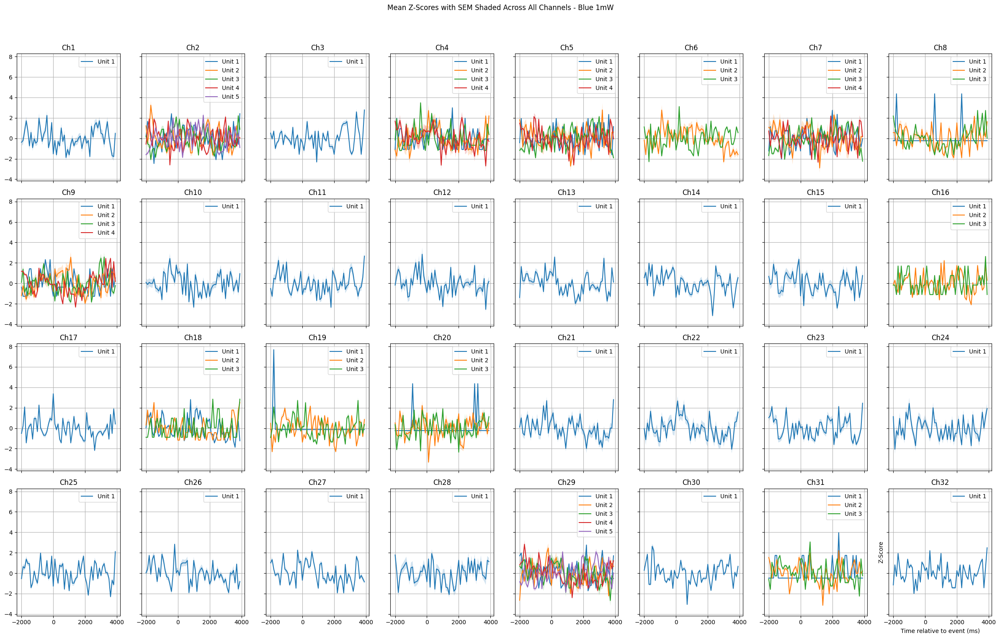

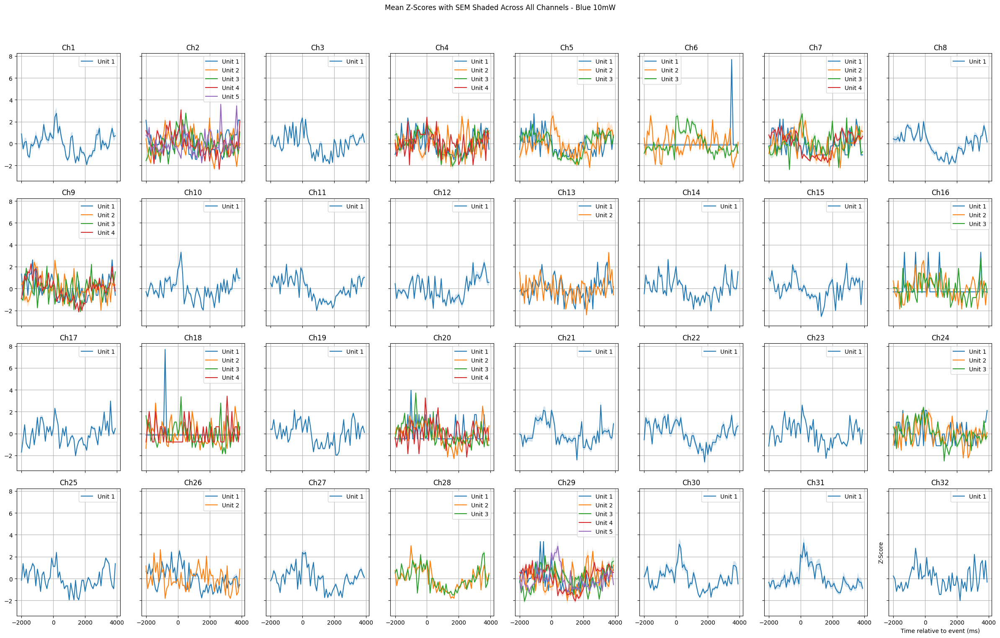

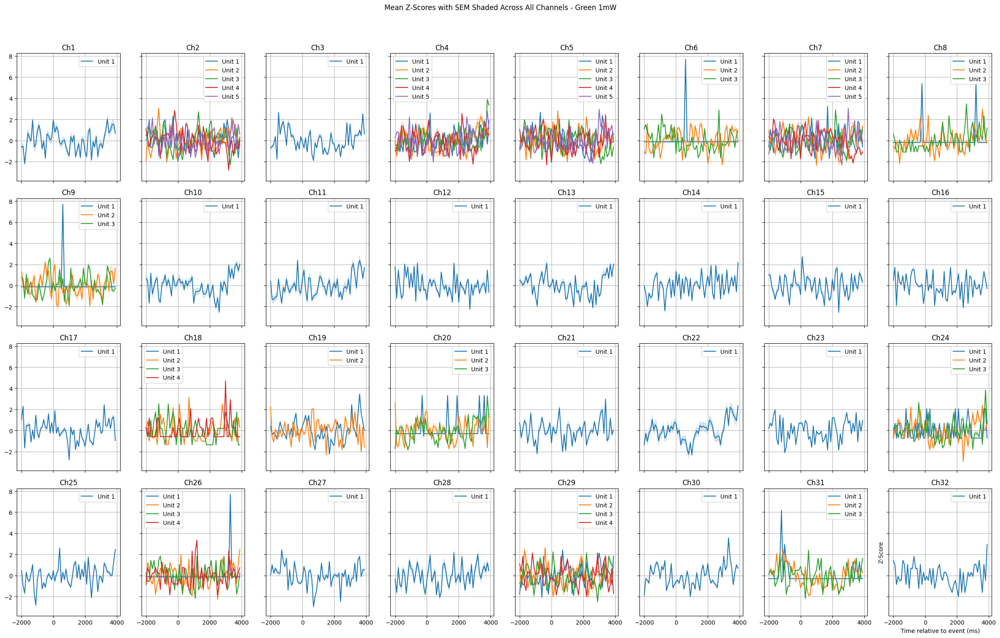

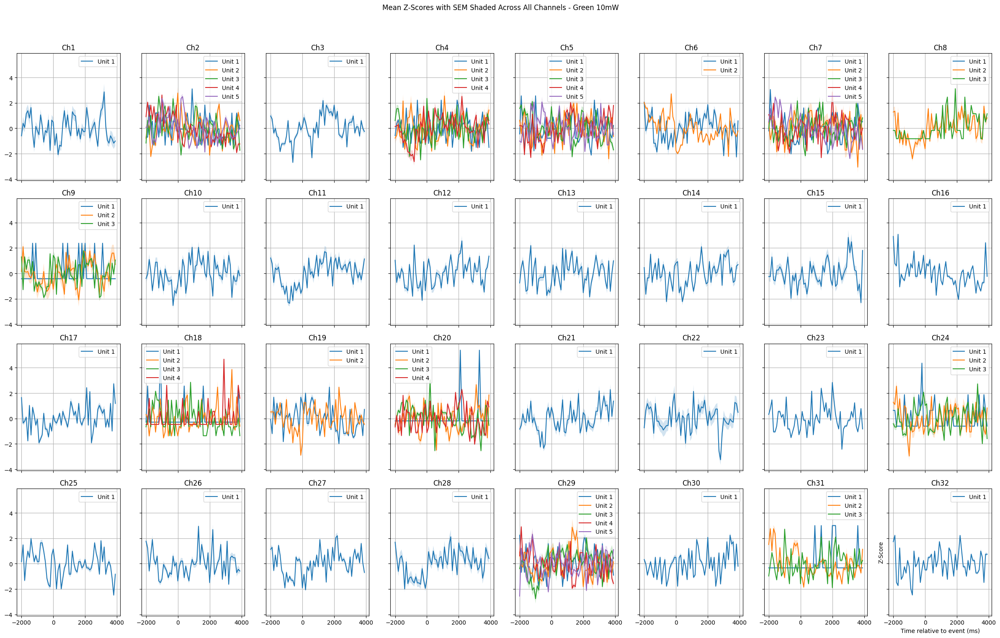

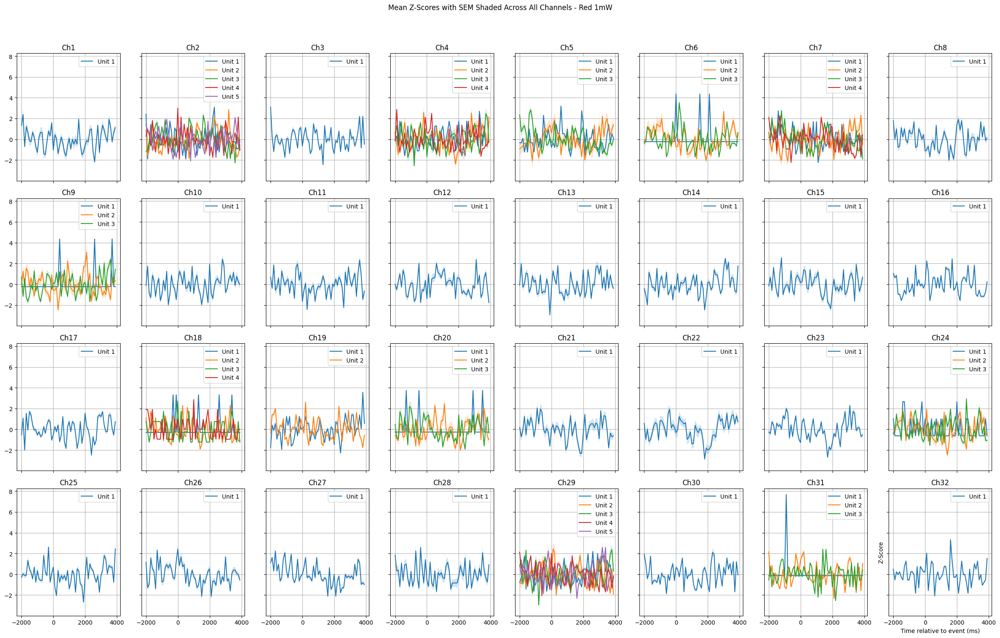

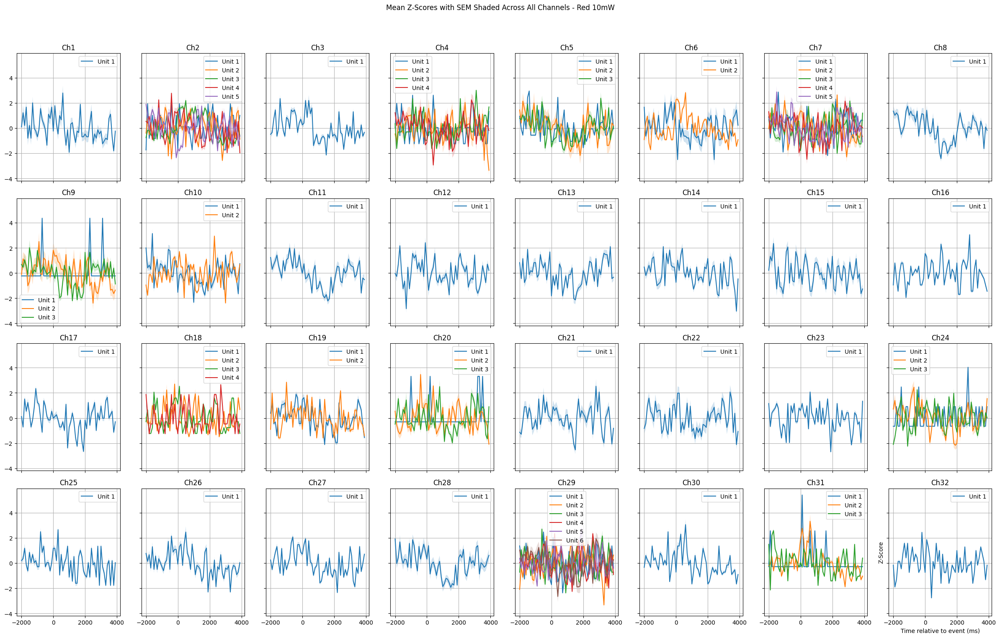

In [16]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import zscore
from scipy.io import loadmat
import os

# Define base path and folders for each experiment
base_path = "/content/drive/My Drive/TeamPrigge/lab_members/Cristian/ephys_ED/PVC_0521/spiketimes/"
experiment_files = {
    'Blue 1mW': '16-15-21',
    'Blue 10mW': '16-30-14',
    'Green 1mW': '17-09-29',
    'Green 10mW': '17-26-26',
    'Red 1mW': '16-38-34',
    'Red 10mW': '16-53-13'
}

num_channels = 32  # Total number of channels
num_rows = 4  # Rows in subplot grid
num_cols = 8  # Columns in subplot grid
bin_edges = np.arange(-2000, 4001, 100)  # Define histogram bin edges

# Loop through each experiment folder and generate plots
for condition, folder in experiment_files.items():
    # Load TTL data for the current folder
    ttl_file_path = os.path.join(base_path, folder, 'Stim.mat')
    TTL = loadmat(ttl_file_path)
    sampling_rate_kHz = 30  # Sampling rate in kHz
    selected_points_in_ms = TTL['selectedPoints'] / sampling_rate_kHz  # Convert to milliseconds

    # Initialize the trial_spike_times for all channels
    all_channels_trial_spike_times = {}

    # Load spike times for all channels
    for channel_num in range(1, num_channels + 1):
        channel_name = f'Ch{channel_num}'
        mat_file = f'spikeTP_times_CMR_{channel_name}.mat'
        mat_data = loadmat(os.path.join(base_path, folder, mat_file))
        separated_matrix = mat_data['separatedMatrix']
        num_units = separated_matrix.shape[1]

        # Initialize a dictionary to hold spike times per trial
        trial_spike_times = {}

        # Process each selected time point
        for trial_idx, time_point in enumerate(selected_points_in_ms):
            window_start = time_point - 2000  # 2 seconds before the point
            window_end = time_point + 4000  # 4 seconds after the point
            spike_times_in_window = []

            for unit in range(num_units):
                unit_spike_times = separated_matrix[:, unit]
                relative_spike_times = unit_spike_times - time_point
                valid_spike_times = relative_spike_times[(relative_spike_times >= -2000) & (relative_spike_times <= 4000)]
                spike_times_in_window.append(valid_spike_times)

            trial_spike_times[trial_idx + 1] = spike_times_in_window

        all_channels_trial_spike_times[channel_name] = trial_spike_times

    # Create a grid for plotting
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(24, 16), sharex=True, sharey=True)
    axes = axes.flatten()

    # Loop through channels and plot Z-scores with SEM
    for channel_index, (channel_name, trial_spike_times) in enumerate(all_channels_trial_spike_times.items()):
        num_units = len(next(iter(trial_spike_times.values())))
        all_binned_counts = [[] for _ in range(num_units)]

        # Aggregate the spike counts for each unit across all trials
        for spikes_per_unit in trial_spike_times.values():
            for unit_index, spikes in enumerate(spikes_per_unit):
                binned_counts, _ = np.histogram(spikes, bins=bin_edges)
                all_binned_counts[unit_index].append(binned_counts)

        # Calculate the mean Z-scores and SEM for each unit
        mean_z_scores_per_unit = []
        sem_per_unit = []
        for unit_binned_counts in all_binned_counts:
            unit_binned_counts = np.array(unit_binned_counts)
            mean_counts = np.mean(unit_binned_counts, axis=0)
            sem_counts = np.std(unit_binned_counts, axis=0) / np.sqrt(unit_binned_counts.shape[0])
            mean_z_scores = zscore(mean_counts)  # Compute the Z-scores
            mean_z_scores_per_unit.append(mean_z_scores)
            sem_per_unit.append(sem_counts)

        # Plot the data for this channel on the appropriate subplot
        ax = axes[channel_index]
        for unit_idx, (mean_z_scores, sem_counts) in enumerate(zip(mean_z_scores_per_unit, sem_per_unit)):
            ax.plot(bin_edges[:-1], mean_z_scores, label=f'Unit {unit_idx + 1}', linestyle='-')
            ax.fill_between(
                bin_edges[:-1],
                mean_z_scores - sem_counts,
                mean_z_scores + sem_counts,
                alpha=0.2  # Adjust this to modify the opacity of the shaded area
            )
        ax.set_title(f'{channel_name}')
        ax.grid(True)
        ax.legend()

    # Set the layout and titles for the overall plot
    plt.xlabel('Time relative to event (ms)')
    plt.ylabel('Z-Score')
    plt.suptitle(f'Mean Z-Scores with SEM Shaded Across All Channels - {condition}')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Save the plot for each condition
    output_path = os.path.join(base_path, f'{condition}_ZScores_All_Channels.pdf')
    plt.savefig(output_path)

    plt.show()


PVC 0449 MsACR

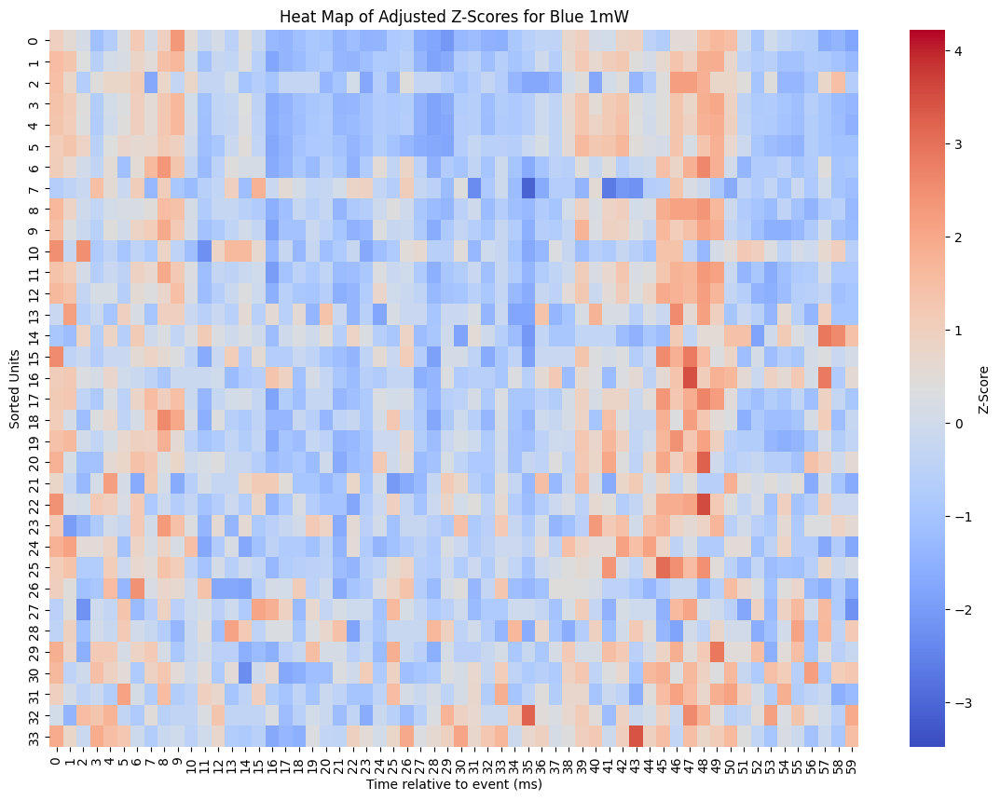

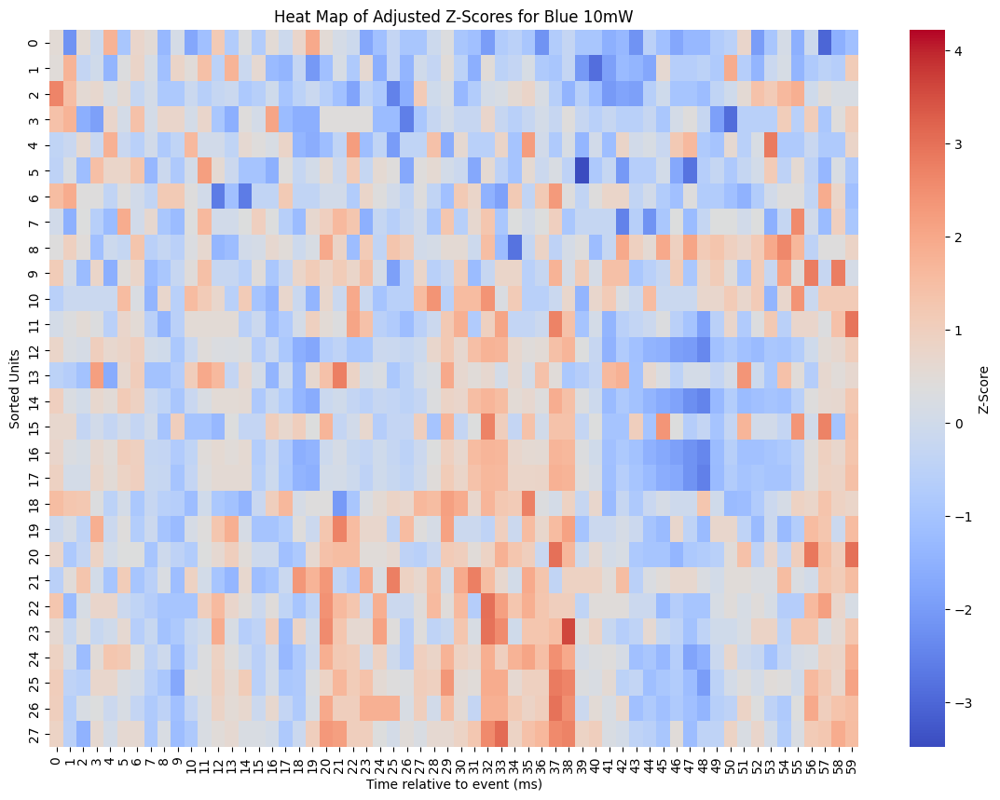

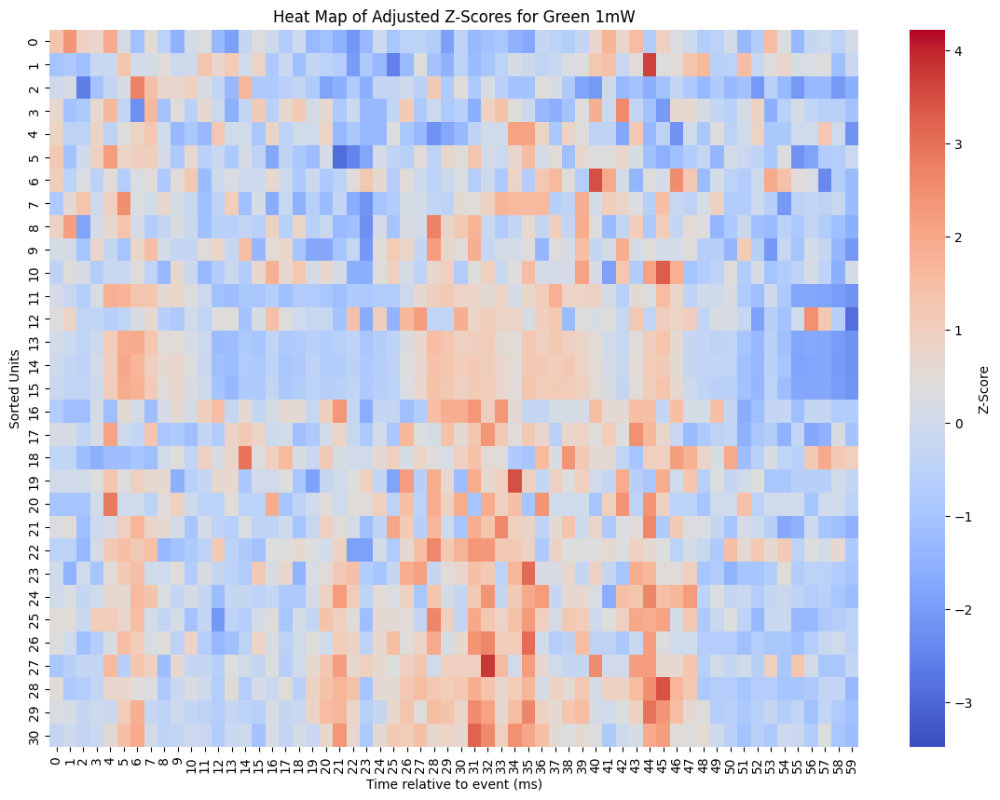

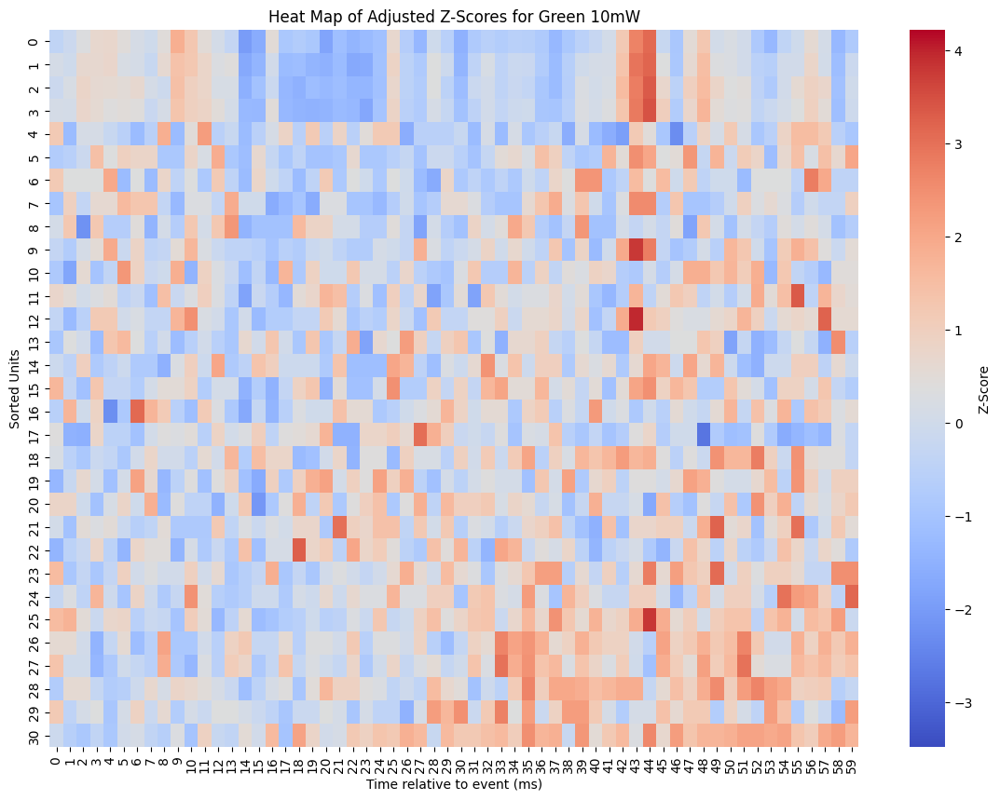

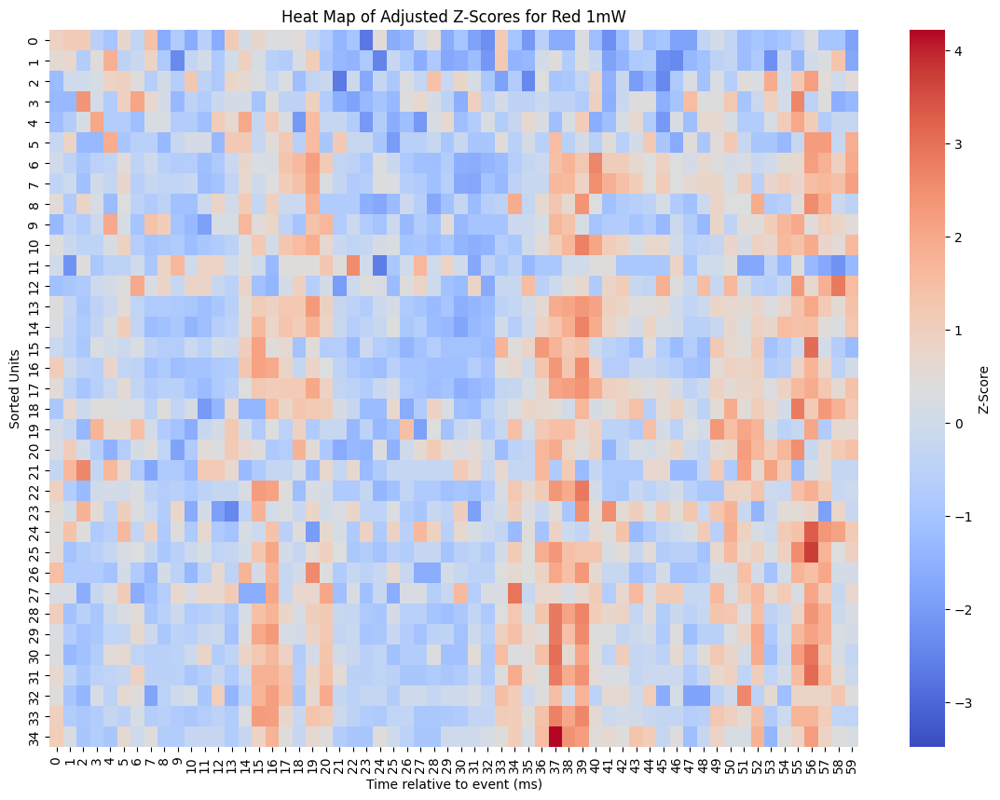

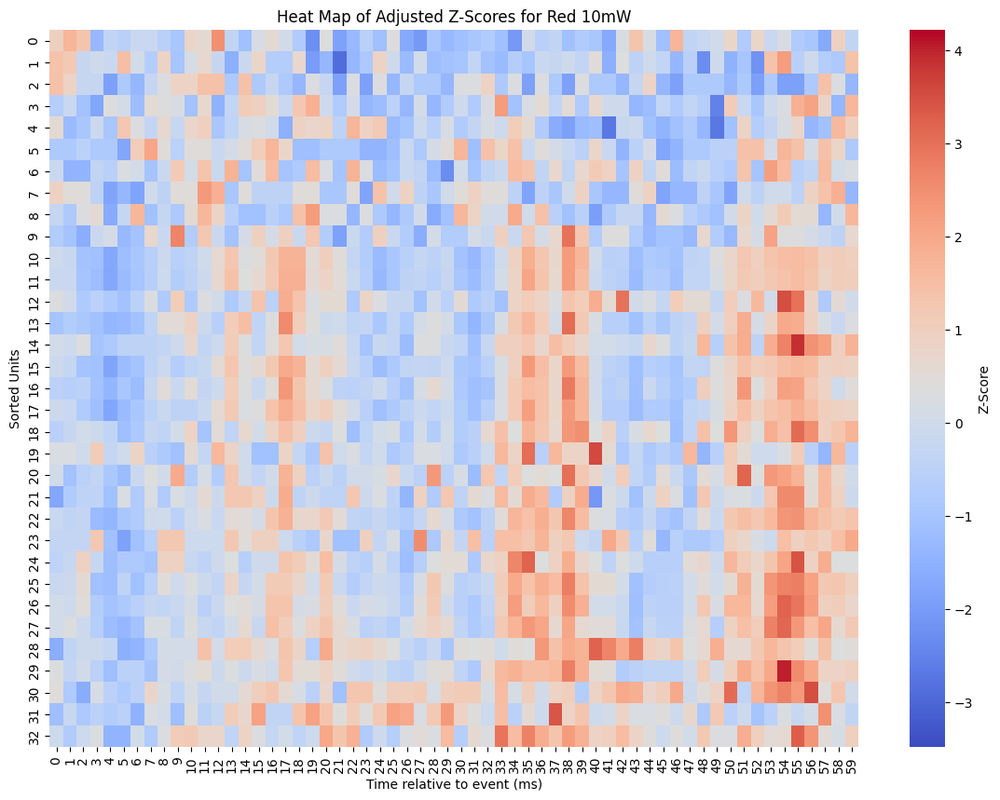

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.io import loadmat
from scipy.stats import zscore
import os

# Define base path and folders for each experiment
base_path = "/content/drive/My Drive/TeamPrigge/lab_members/Cristian/ephys_ED/PVC_0449/spiketimes/"
experiment_files = {
    'Blue 1mW': '14-03-02',
    'Blue 10mW': '14-19-28',
    'Green 1mW': '15-13-22',
    'Green 10mW': '15-30-24',
    'Red 1mW': '14-32-36',
    'Red 10mW': '14-41-46'
}

num_channels = 32  # Total number of channels per experiment
baseline_bins = 20  # First 20 bins are the baseline period
response_window = (20, 40)  # Define the response window between bins 20 and 40
bin_edges = np.arange(-2000, 4001, 100)  # Define histogram bin edges
num_bins = len(bin_edges) - 1

# Initialize a dictionary to hold all heatmaps for normalization
all_z_scores_data = {}

# Loop through each experiment folder
for condition, folder in experiment_files.items():
    # Load TTL data for the current folder
    ttl_file_path = os.path.join(base_path, folder, 'Stim.mat')
    TTL = loadmat(ttl_file_path)
    sampling_rate_kHz = 30  # Sampling rate in kHz
    selectedPointsInMS = TTL['selectedPoints'] / sampling_rate_kHz  # Convert to milliseconds

    # Initialize a list to collect all z-scores across all channels and units for this condition
    all_adjusted_z_scores = []

    # Initialize a list to collect the mean response difference for each unit
    response_differences = []

    # Loop through each channel in this experiment
    for channel_num in range(1, num_channels + 1):
        channel_name = f'Ch{channel_num}'
        mat_file = f'spikeTP_times_CMR_{channel_name}.mat'
        mat_data = loadmat(os.path.join(base_path, folder, mat_file))
        separated_matrix = mat_data['separatedMatrix']
        num_units = separated_matrix.shape[1]

        # Initialize a dictionary to hold spike times per trial
        trial_spike_times = {}

        # Process each selected time point
        for trial_idx, time_point in enumerate(selectedPointsInMS):
            window_start = time_point - 2000  # 2 seconds before the point
            window_end = time_point + 4000  # 4 seconds after the point
            spike_times_in_window = []

            for unit in range(num_units):
                unit_spike_times = separated_matrix[:, unit]
                relative_spike_times = unit_spike_times - time_point
                valid_spike_times = relative_spike_times[(relative_spike_times >= -2000) & (relative_spike_times <= 4000)]
                spike_times_in_window.append(valid_spike_times)

            trial_spike_times[trial_idx + 1] = spike_times_in_window

        # Aggregate spike counts for each unit across all trials
        all_binned_counts = [[] for _ in range(num_units)]

        for spikes_per_unit in trial_spike_times.values():
            for unit_index, spikes in enumerate(spikes_per_unit):
                binned_counts, _ = np.histogram(spikes, bins=bin_edges)
                all_binned_counts[unit_index].append(binned_counts)

        # Calculate mean z-scores and adjust using the baseline, excluding units with any zero bin counts
        for unit_binned_counts in all_binned_counts:
            unit_binned_counts = np.array(unit_binned_counts)
            # Check if any bin has a zero count across all trials
            if np.any(np.sum(unit_binned_counts, axis=0) == 0):
                continue  # Skip this unit

            mean_counts = np.mean(unit_binned_counts, axis=0)
            mean_z_scores = zscore(mean_counts)

            # Calculate the baseline offset as the mean of the first 20 bins
            baseline_offset = np.mean(mean_z_scores[:baseline_bins])
            adjusted_z_scores = mean_z_scores - baseline_offset

            all_adjusted_z_scores.append(adjusted_z_scores)

            # Calculate the mean response difference between the response window and baseline
            response_mean = np.mean(adjusted_z_scores[response_window[0]:response_window[1]])
            baseline_mean = np.mean(adjusted_z_scores[:baseline_bins])
            response_difference = response_mean - baseline_mean
            response_differences.append(response_difference)

    # Sort the units based on response differences
    sorted_indices = np.argsort(response_differences)
    sorted_adjusted_z_scores = np.array(all_adjusted_z_scores)[sorted_indices]

    # Store sorted data in the dictionary for consistent color scaling
    all_z_scores_data[condition] = sorted_adjusted_z_scores

# Get the global min and max values for a consistent color scale across all conditions
global_min = min(np.min(scores) for scores in all_z_scores_data.values())
global_max = max(np.max(scores) for scores in all_z_scores_data.values())

# Plot all heatmaps with consistent color scaling
for condition, sorted_adjusted_z_scores in all_z_scores_data.items():
    plt.figure(figsize=(14, 10))
    sns.heatmap(sorted_adjusted_z_scores, cmap='coolwarm', vmin=global_min, vmax=global_max, cbar_kws={'label': 'Z-Score'})
    plt.xlabel('Time relative to event (ms)')
    plt.ylabel('Sorted Units')
    plt.title(f'Heat Map of Adjusted Z-Scores for {condition}')


    # Generate the full file path using the sanitized condition name
    output_path = os.path.join(base_path,'0449MsACR' f'{condition}')

    # Ensure the directory exists
    os.makedirs(base_dir, exist_ok=True)

    # Save the plot before calling plt.show()
    plt.savefig(output_path)
    plt.show()


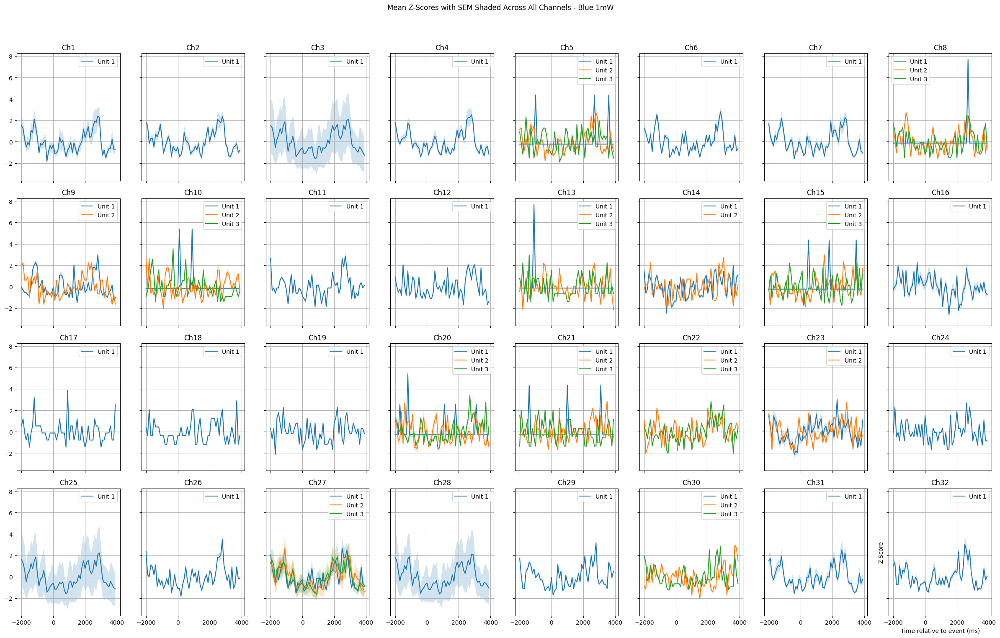

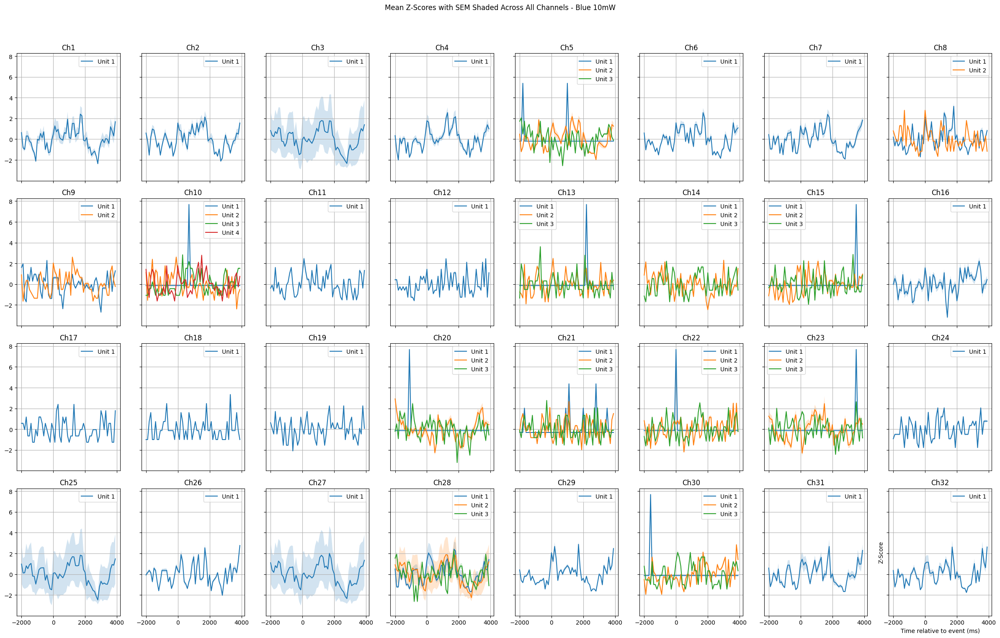

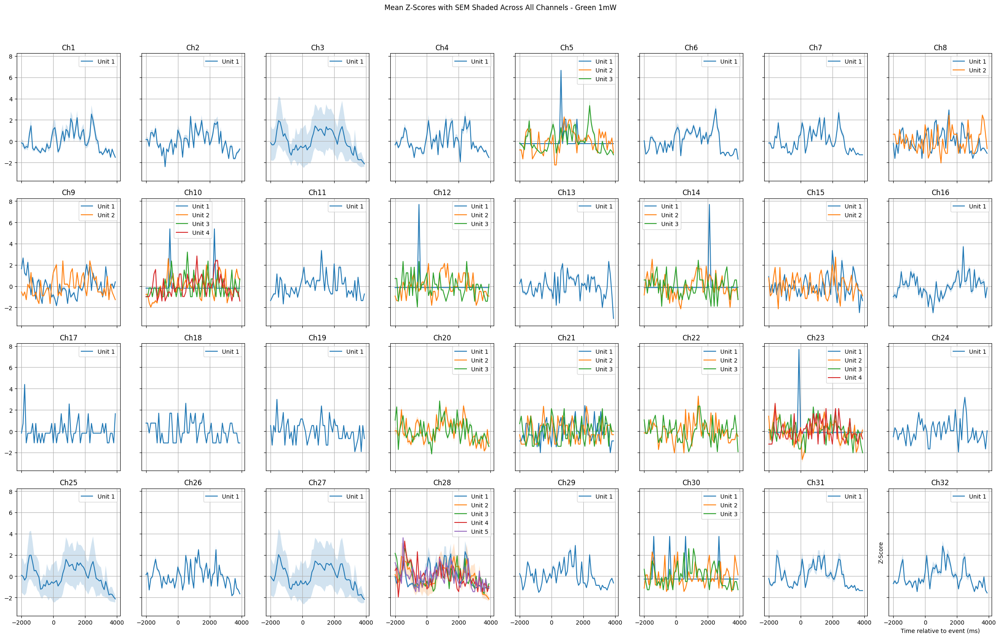

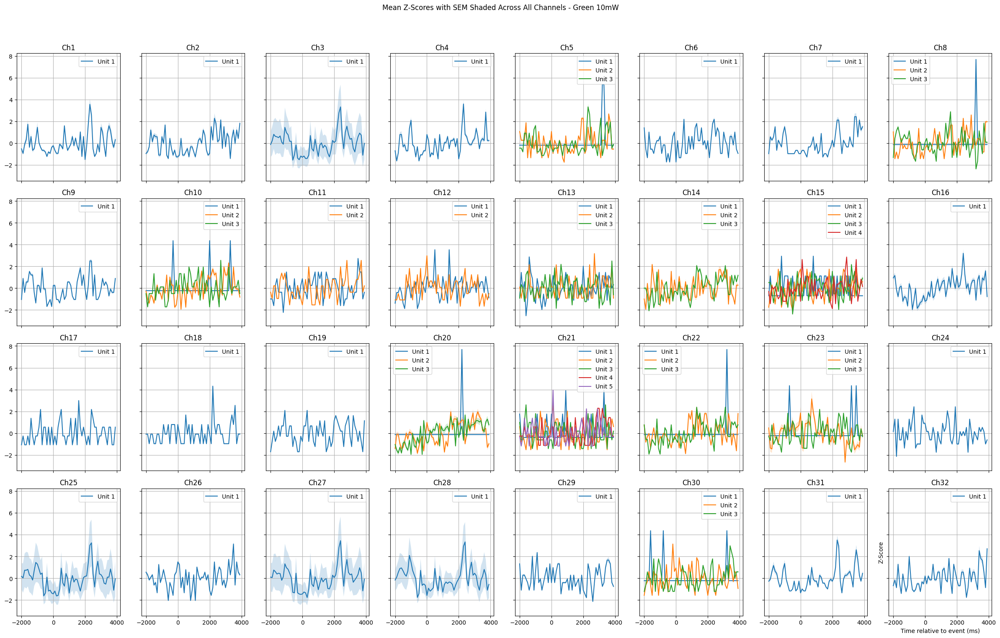

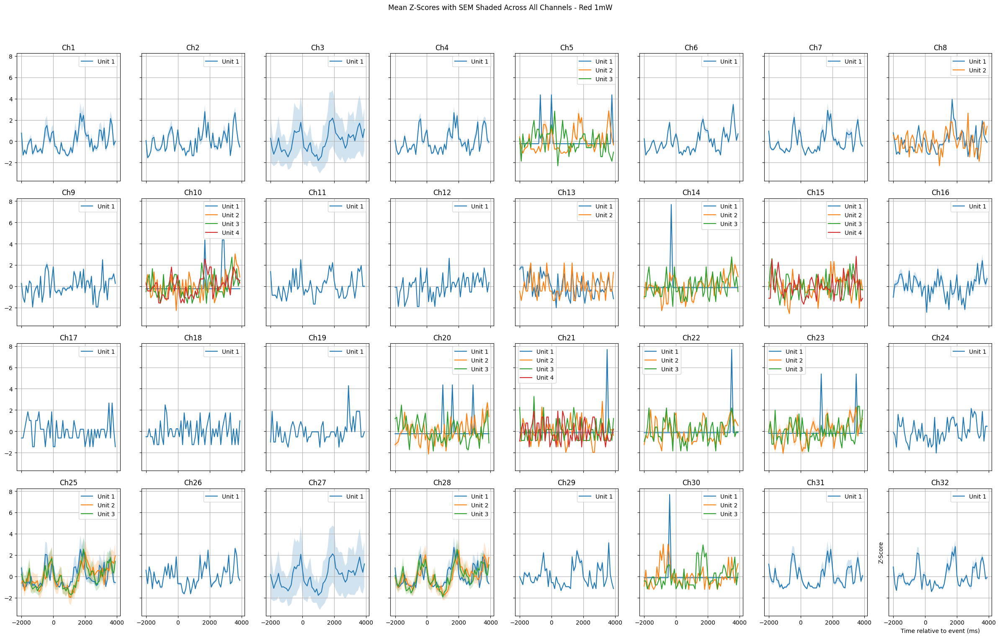

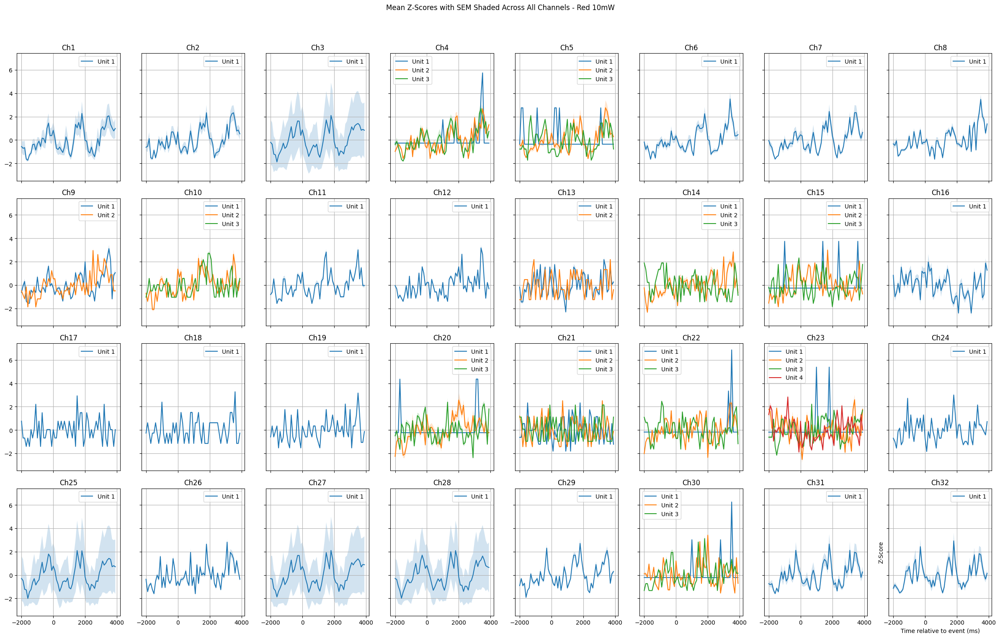

In [19]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import zscore
from scipy.io import loadmat
import os

# Define base path and folders for each experiment
base_path = "/content/drive/My Drive/TeamPrigge/lab_members/Cristian/ephys_ED/PVC_0449/spiketimes/"
experiment_files = {
    'Blue 1mW': '14-03-02',
    'Blue 10mW': '14-19-28',
    'Green 1mW': '15-13-22',
    'Green 10mW': '15-30-24',
    'Red 1mW': '14-32-36',
    'Red 10mW': '14-41-46'
}

num_channels = 32  # Total number of channels
num_rows = 4  # Rows in subplot grid
num_cols = 8  # Columns in subplot grid
bin_edges = np.arange(-2000, 4001, 100)  # Define histogram bin edges

# Loop through each experiment folder and generate plots
for condition, folder in experiment_files.items():
    # Load TTL data for the current folder
    ttl_file_path = os.path.join(base_path, folder, 'Stim.mat')
    TTL = loadmat(ttl_file_path)
    sampling_rate_kHz = 30  # Sampling rate in kHz
    selected_points_in_ms = TTL['selectedPoints'] / sampling_rate_kHz  # Convert to milliseconds

    # Initialize the trial_spike_times for all channels
    all_channels_trial_spike_times = {}

    # Load spike times for all channels
    for channel_num in range(1, num_channels + 1):
        channel_name = f'Ch{channel_num}'
        mat_file = f'spikeTP_times_CMR_{channel_name}.mat'
        mat_data = loadmat(os.path.join(base_path, folder, mat_file))
        separated_matrix = mat_data['separatedMatrix']
        num_units = separated_matrix.shape[1]

        # Initialize a dictionary to hold spike times per trial
        trial_spike_times = {}

        # Process each selected time point
        for trial_idx, time_point in enumerate(selected_points_in_ms):
            window_start = time_point - 2000  # 2 seconds before the point
            window_end = time_point + 4000  # 4 seconds after the point
            spike_times_in_window = []

            for unit in range(num_units):
                unit_spike_times = separated_matrix[:, unit]
                relative_spike_times = unit_spike_times - time_point
                valid_spike_times = relative_spike_times[(relative_spike_times >= -2000) & (relative_spike_times <= 4000)]
                spike_times_in_window.append(valid_spike_times)

            trial_spike_times[trial_idx + 1] = spike_times_in_window

        all_channels_trial_spike_times[channel_name] = trial_spike_times

    # Create a grid for plotting
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(24, 16), sharex=True, sharey=True)
    axes = axes.flatten()

    # Loop through channels and plot Z-scores with SEM
    for channel_index, (channel_name, trial_spike_times) in enumerate(all_channels_trial_spike_times.items()):
        num_units = len(next(iter(trial_spike_times.values())))
        all_binned_counts = [[] for _ in range(num_units)]

        # Aggregate the spike counts for each unit across all trials
        for spikes_per_unit in trial_spike_times.values():
            for unit_index, spikes in enumerate(spikes_per_unit):
                binned_counts, _ = np.histogram(spikes, bins=bin_edges)
                all_binned_counts[unit_index].append(binned_counts)

        # Calculate the mean Z-scores and SEM for each unit
        mean_z_scores_per_unit = []
        sem_per_unit = []
        for unit_binned_counts in all_binned_counts:
            unit_binned_counts = np.array(unit_binned_counts)
            mean_counts = np.mean(unit_binned_counts, axis=0)
            sem_counts = np.std(unit_binned_counts, axis=0) / np.sqrt(unit_binned_counts.shape[0])
            mean_z_scores = zscore(mean_counts)  # Compute the Z-scores
            mean_z_scores_per_unit.append(mean_z_scores)
            sem_per_unit.append(sem_counts)

        # Plot the data for this channel on the appropriate subplot
        ax = axes[channel_index]
        for unit_idx, (mean_z_scores, sem_counts) in enumerate(zip(mean_z_scores_per_unit, sem_per_unit)):
            ax.plot(bin_edges[:-1], mean_z_scores, label=f'Unit {unit_idx + 1}', linestyle='-')
            ax.fill_between(
                bin_edges[:-1],
                mean_z_scores - sem_counts,
                mean_z_scores + sem_counts,
                alpha=0.2  # Adjust this to modify the opacity of the shaded area
            )
        ax.set_title(f'{channel_name}')
        ax.grid(True)
        ax.legend()

    # Set the layout and titles for the overall plot
    plt.xlabel('Time relative to event (ms)')
    plt.ylabel('Z-Score')
    plt.suptitle(f'Mean Z-Scores with SEM Shaded Across All Channels - {condition}')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Save the plot for each condition
    output_path = os.path.join(base_path, f'{condition}_ZScores_All_Channels.pdf')
    plt.savefig(output_path)

    plt.show()
